<h1><center>CA1 Machine Learning</center></h1>
<h1><center>Airlines Customer Satisfaction</center></h1>


    
Report by:  <font color=blue> Bobbi McDermott, Leandro Marigo, Melissa Miskell, Damaris Nascimento deSouza  

Lecturer: <font color=blue> Dr. Muhammad Iqbal
    
Date: <font color=blue> 27 November 2022 



# Licence

CC0 1.0 Universal (CC0 1.0)
Public Domain Dedication


No Copyright
The person who associated a work with this deed has dedicated the work to the public domain by waiving all of his or her rights to the work worldwide under copyright law, including all related and neighboring rights, to the extent allowed by law.

You can copy, modify, distribute and perform the work, even for commercial purposes, all without asking permission. See Other Information below


Other Information
In no way are the patent or trademark rights of any person affected by CC0, nor are the rights that other persons may have in the work or in how the work is used, such as publicity or privacy rights.
Unless expressly stated otherwise, the person who associated a work with this deed makes no warranties about the work, and disclaims liability for all uses of the work, to the fullest extent permitted by applicable law.
When using or citing the work, you should not imply endorsement by the author or the affirmer.


# Libraries

Import numpy for mathematical functions  
Import Pandas for analysis tools  
Import matplotlib.pylot for visualizations  
Import Seaborn for data visualiations based on matplotlib  
Import Sklearn for for classification, regression, clustering and dimensionality reduction   
import pandas_profiling for descriptive statistic visualisations  
from sklearn.preprocessing import OrdinalEncoder    
from sklearn.tree import DecisionTreeClassifier         
from sklearn.model_selection import train_test_split    
from sklearn import metrics                           
from sklearn import tree  
from collections import Counter  
from imblearn.over_sampling import SMOTE   
import matplotlib.pyplot as plt  
from sklearn.tree import DecisionTreeClassifier  
from sklearn import tree  
from sklearn.ensemble import RandomForestClassifier  
from sklearn.model_selection import KFold  
from sklearn.model_selection import train_test_split, KFold  
from sklearn.preprocessing import MinMaxScaler  
from sklearn.neighbors import KNeighborsClassifier  
from sklearn import metrics  
from sklearn.metrics import accuracy_score  
from sklearn import metrics  
from sklearn.metrics import confusion_matrix  
from sklearn.metrics import classification_report  
from sklearn.linear_model import LogisticRegression  
from sklearn.metrics import accuracy_score  
from sklearn.metrics import roc_auc_score  
from sklearn.metrics import roc_curve  




In [1]:
from IPython.display import HTML
HTML('''<script>
code_show=true;
function code_toggle() {
if (code_show){
$('div.input').hide();
}else{
$('div.input').show();
}
code_show = !code_show
}
$(document).ready(code_toggle);
</script>
<form action="javascript:code_toggle()"><input type="submit" value="Click here to toggle on/off the raw code."></form>''')

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h1 style="text-align:center"> EDA <h1>
    
    
    

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline
%matplotlib notebook

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Descriptive Statistics <h3>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [3]:
df= pd.read_csv("Invistico_Airline.csv")

In [4]:
with pd.option_context("display.max_columns", None):
    display(df)

,satisfaction,Gender,Customer Type,Age,Type of Travel,Class,Flight Distance,Seat comfort,Departure/Arrival time convenient,Food and drink,Gate location,Inflight wifi service,Inflight entertainment,Online support,Ease of Online booking,On-board service,Leg room service,Baggage handling,Checkin service,Cleanliness,Online boarding,Departure Delay in Minutes,Arrival Delay in Minutes
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,5,5,5,3,2,5,2,2,3,3,4,4,4,2,0,0.0
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,2,3,2,4,2,1,1,3,2,3,3,1,2,1,174,172.0
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,3,0,3,3,3,2,2,4,4,3,4,2,3,2,155,163.0
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,3,2,3,2,3,2,2,3,3,2,3,2,1,2,193,205.0


In [5]:
df = df.rename (columns={"Customer Type":"custom_type","Type of Travel":"travel_type","Flight Distance":"FlightDistance_rate","Seat comfort":"SeatComfort_rating","Departure/Arrival time convenient":"DepartArriveTime_rate","Food and drink":"sustenance_rate","Gate location":"GateLocation_rate","Inflight wifi service":"FlightWifi_rate","Inflight entertainment":"FlightEntertainment_rate","Online support":"OnlineSupport_rate","Ease of Online booking":"OnlineBook_rate","On-board service":"Onboard_rate","Leg room service":"LegRoom_rate","Baggage handling":"BagHandle_rate","Checkin service":"Checkin_rate","Online boarding":"OnlineBoard_rate","Departure Delay in Minutes":"DepDelayMin","Arrival Delay in Minutes":"ArriveDelayMin"})   
                      

It is Good standard practise for column names: 
Spaces have been removed between words/abbrev used where possible 
Data measured with rating abbreviated with _rating 

In [6]:
#Cross validating columns have been renamed
with pd.option_context("display.max_columns", None):
    display(df)

,satisfaction,Gender,custom_type,Age,travel_type,Class,FlightDistance_rate,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,DepDelayMin,ArriveDelayMin
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0,0,2,2,4,2,3,3,0,3,5,3,2,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,0,0,0,3,0,2,2,3,4,4,4,2,3,2,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0,0,3,2,0,2,2,3,3,4,4,4,2,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0,0,3,3,4,3,1,1,0,1,4,1,3,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0,0,3,4,3,4,2,2,0,2,4,2,5,0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,5,5,5,3,2,5,2,2,3,3,4,4,4,2,0,0.0
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,2,3,2,4,2,1,1,3,2,3,3,1,2,1,174,172.0
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,3,0,3,3,3,2,2,4,4,3,4,2,3,2,155,163.0
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,3,2,3,2,3,2,2,3,3,2,3,2,1,2,193,205.0


<IPython.core.display.Javascript object>


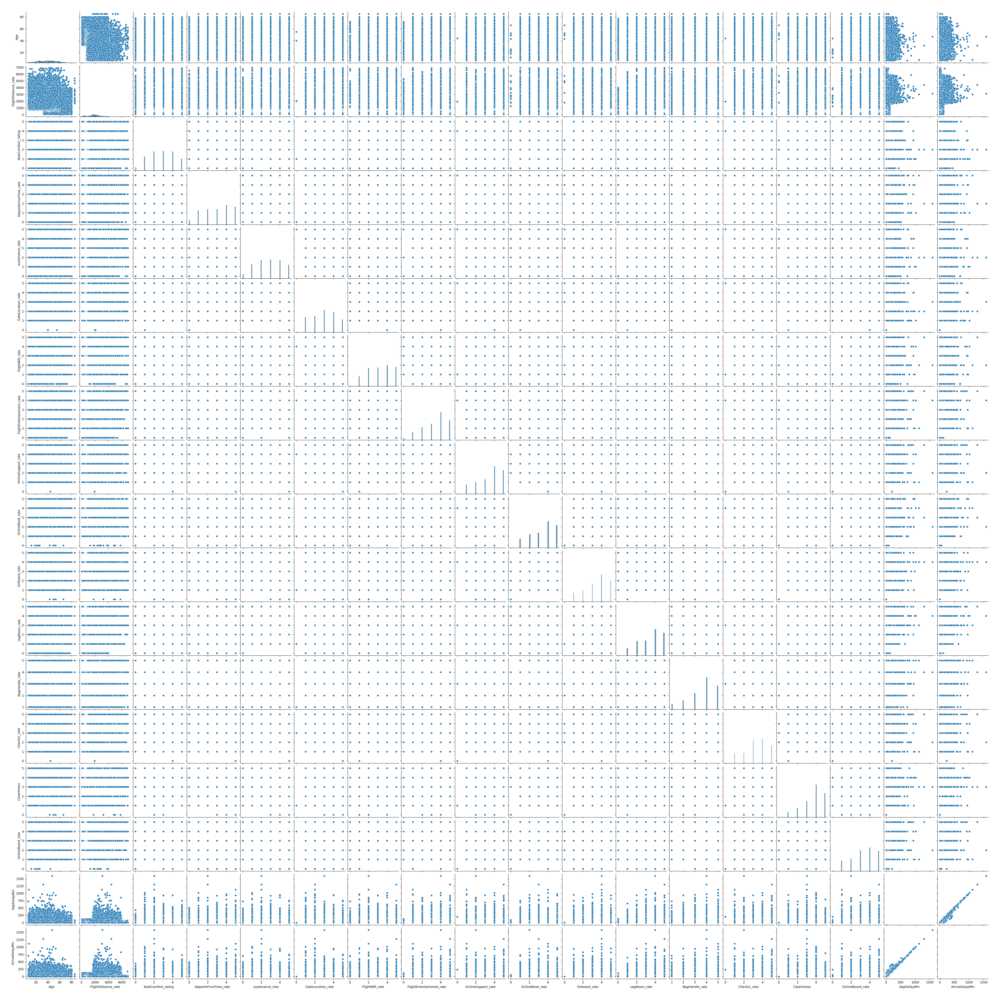

In [7]:
sns.pairplot(df)

Early visualisations demonstrate various aspects of correlations

In [8]:
df.shape

(129880, 23)

Here we can visualize the datatype, unique and null values 

In [9]:
(df==0).sum()

satisfaction                    0
Gender                          0
custom_type                     0
Age                             0
travel_type                     0
Class                           0
FlightDistance_rate             0
SeatComfort_rating           4797
DepartArriveTime_rate        6664
sustenance_rate              5945
GateLocation_rate               2
FlightWifi_rate               132
FlightEntertainment_rate     2978
OnlineSupport_rate              1
OnlineBook_rate                18
Onboard_rate                    5
LegRoom_rate                  444
BagHandle_rate                  0
Checkin_rate                    1
Cleanliness                     5
OnlineBoard_rate               14
DepDelayMin                 73356
ArriveDelayMin              72753
dtype: int64

In [10]:
df['satisfaction'].unique

<bound method Series.unique of 0            satisfied
1            satisfied
2            satisfied
3            satisfied
4            satisfied
              ...     
129875       satisfied
129876    dissatisfied
129877    dissatisfied
129878    dissatisfied
129879    dissatisfied
Name: satisfaction, Length: 129880, dtype: object>

In [11]:
df.describe()

,Age,FlightDistance_rate,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,DepDelayMin,ArriveDelayMin
count,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129880.000000,129487.000000
mean,39.427957,1981.409055,2.838597,2.990645,2.851994,2.990422,3.249130,3.383477,3.519703,3.472105,3.465075,3.485902,3.695673,3.340807,3.705759,3.352587,14.713713,15.091129
std,15.119360,1027.115606,1.392983,1.527224,1.443729,1.305970,1.318818,1.346059,1.306511,1.305560,1.270836,1.292226,1.156483,1.260582,1.151774,1.298715,38.071126,38.465650
min,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,27.000000,1359.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000,0.000000,0.000000
50%,40.000000,1925.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,0.000000,0.000000
75%,51.000000,2544.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000,12.000000,13.000000
max,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


<ul>
    <li>Age median of the customers in survery is 40 years</li>
    <li>Overall the median score of all ratings is between 3 and 4, however this does not take into account satisfied vs unsatisfied customers and is a brief overview of the dataset.</li>
</ul>

In [12]:
df_sat = df
df_unsat = df

In [13]:
 df_sat = df_sat[df_sat['satisfaction'] == "satisfied"]
df_unsat = df_unsat[df_unsat['satisfaction'] == "dissatisfied"]

We've divided the dataset into two separate datasets 'df_sat' for the satisfied variable and 'df_unsat' for the dissatified variable 

In [14]:
df_sat.describe()

,Age,FlightDistance_rate,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,DepDelayMin,ArriveDelayMin
count,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.00000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,71087.000000,70882.000000
mean,41.050051,1944.770281,3.145653,2.969108,3.010438,2.976086,3.521460,4.024308,3.98326,3.984751,3.871946,3.844247,3.969488,3.645955,3.977394,3.751966,12.154768,12.268883
std,14.250302,1127.893115,1.586321,1.540998,1.572813,1.375912,1.231971,1.186479,1.13193,1.062831,1.121387,1.168736,1.097098,1.158799,1.085534,1.137476,32.676796,33.100908
min,7.000000,50.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000
25%,30.000000,1070.000000,2.000000,2.000000,2.000000,2.000000,3.000000,4.000000,4.00000,4.000000,3.000000,3.000000,4.000000,3.000000,4.000000,3.000000,0.000000,0.000000
50%,42.000000,1886.000000,4.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.00000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,0.000000,0.000000
75%,52.000000,2627.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,9.000000,9.000000
max,85.000000,6950.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1305.000000,1280.000000


When statistical info is displayed for satisifed customers the median age becomes 42
While median rating remains between 3 and 4


In [15]:
df_unsat.describe()

,Age,FlightDistance_rate,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,DepDelayMin,ArriveDelayMin
count,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58793.000000,58605.000000
mean,37.466671,2025.709234,2.467335,3.016686,2.660419,3.007756,2.919854,2.608644,2.959213,2.852261,2.973126,3.052625,3.364601,2.971850,3.377324,2.869695,17.807749,18.504599
std,15.888110,888.148947,0.996059,1.510006,1.243593,1.215827,1.345014,1.097104,1.283645,1.302929,1.266942,1.301665,1.139749,1.279891,1.143987,1.317417,43.513060,43.848751
min,7.000000,50.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,25.000000,1520.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,0.000000,0.000000
50%,36.000000,1955.000000,2.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,3.000000,0.000000,0.000000
75%,49.000000,2462.000000,3.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,16.000000,18.000000
max,85.000000,6951.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,1592.000000,1584.000000


In [16]:
df_unsat['sustenance_rate'].unique()

array([0, 1, 2, 3, 4, 5], dtype=int64)

When statistical info is displayed for dissatisifed customers the median age becomes 36 
While median rating lowers between 2 and 3

In [17]:
df.describe(include=object)

,satisfaction,Gender,custom_type,travel_type,Class
count,129880,129880,129880,129880,129880
unique,2,2,2,2,3
top,satisfied,Female,Loyal Customer,Business travel,Business
freq,71087,65899,106100,89693,62160


In [18]:
df.count()

satisfaction                129880
Gender                      129880
custom_type                 129880
Age                         129880
travel_type                 129880
Class                       129880
FlightDistance_rate         129880
SeatComfort_rating          129880
DepartArriveTime_rate       129880
sustenance_rate             129880
GateLocation_rate           129880
FlightWifi_rate             129880
FlightEntertainment_rate    129880
OnlineSupport_rate          129880
OnlineBook_rate             129880
Onboard_rate                129880
LegRoom_rate                129880
BagHandle_rate              129880
Checkin_rate                129880
Cleanliness                 129880
OnlineBoard_rate            129880
DepDelayMin                 129880
ArriveDelayMin              129487
dtype: int64

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Handling Missing Values <h3>


<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [19]:
df.duplicated().sum()

0

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 129880 entries, 0 to 129879
Data columns (total 23 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   satisfaction              129880 non-null  object 
 1   Gender                    129880 non-null  object 
 2   custom_type               129880 non-null  object 
 3   Age                       129880 non-null  int64  
 4   travel_type               129880 non-null  object 
 5   Class                     129880 non-null  object 
 6   FlightDistance_rate       129880 non-null  int64  
 7   SeatComfort_rating        129880 non-null  int64  
 8   DepartArriveTime_rate     129880 non-null  int64  
 9   sustenance_rate           129880 non-null  int64  
 10  GateLocation_rate         129880 non-null  int64  
 11  FlightWifi_rate           129880 non-null  int64  
 12  FlightEntertainment_rate  129880 non-null  int64  
 13  OnlineSupport_rate        129880 non-null  i

In [21]:
df.isnull().sum()

satisfaction                  0
Gender                        0
custom_type                   0
Age                           0
travel_type                   0
Class                         0
FlightDistance_rate           0
SeatComfort_rating            0
DepartArriveTime_rate         0
sustenance_rate               0
GateLocation_rate             0
FlightWifi_rate               0
FlightEntertainment_rate      0
OnlineSupport_rate            0
OnlineBook_rate               0
Onboard_rate                  0
LegRoom_rate                  0
BagHandle_rate                0
Checkin_rate                  0
Cleanliness                   0
OnlineBoard_rate              0
DepDelayMin                   0
ArriveDelayMin              393
dtype: int64

In [22]:
df=df.dropna()

In [23]:
print(df.isnull().sum())

satisfaction                0
Gender                      0
custom_type                 0
Age                         0
travel_type                 0
Class                       0
FlightDistance_rate         0
SeatComfort_rating          0
DepartArriveTime_rate       0
sustenance_rate             0
GateLocation_rate           0
FlightWifi_rate             0
FlightEntertainment_rate    0
OnlineSupport_rate          0
OnlineBook_rate             0
Onboard_rate                0
LegRoom_rate                0
BagHandle_rate              0
Checkin_rate                0
Cleanliness                 0
OnlineBoard_rate            0
DepDelayMin                 0
ArriveDelayMin              0
dtype: int64


In [24]:
df.count()

satisfaction                129487
Gender                      129487
custom_type                 129487
Age                         129487
travel_type                 129487
Class                       129487
FlightDistance_rate         129487
SeatComfort_rating          129487
DepartArriveTime_rate       129487
sustenance_rate             129487
GateLocation_rate           129487
FlightWifi_rate             129487
FlightEntertainment_rate    129487
OnlineSupport_rate          129487
OnlineBook_rate             129487
Onboard_rate                129487
LegRoom_rate                129487
BagHandle_rate              129487
Checkin_rate                129487
Cleanliness                 129487
OnlineBoard_rate            129487
DepDelayMin                 129487
ArriveDelayMin              129487
dtype: int64

In [25]:
#old shape multiplied by the no. columns
129880*23

2987240

In [26]:
#Old shape minus the new shape 
129880-129487

393

In [27]:
#Dropped data multiplied by the columns
393*23

9039

In [28]:
#Old shape divided by the dropped data
9039/2987240

0.003025870033877425

In [29]:
#Rounding to a Percentage = % of data loss
0.003025870033877425*100

0.3025870033877425

In [30]:
df.shape

(129487, 23)

According to William J. Montelpare, Ph.D., Emily Read, Ph.D., Teri McComber, Alyson Mahar, Ph.D., and Krista Ritchie, Ph.D., cited in their open book 'Applied Statistics in Healthcare Research' when considering dropping missing values, a good rule of thumb is to ensure data loss does not exceed 5%. Whilst carrying out EDA, analysts carrying out this piece of work, have ensured an even smaller loss of below <1% demonstrated with a simple calculation.

In [31]:
df_fill = df [["SeatComfort_rating", "DepartArriveTime_rate", "sustenance_rate", "GateLocation_rate", "FlightWifi_rate", "FlightEntertainment_rate", "OnlineSupport_rate", "OnlineBook_rate", "Onboard_rate", "LegRoom_rate", "BagHandle_rate", "Checkin_rate", "Cleanliness", "OnlineBoard_rate"]]

In [32]:
df_fill.describe()

,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
count,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000,129487.000000
mean,2.838586,2.990277,2.852024,2.990377,3.249160,3.383745,3.519967,3.472171,3.465143,3.486118,3.695460,3.340729,3.705886,3.352545
std,1.392873,1.527183,1.443587,1.305917,1.318765,1.345959,1.306326,1.305573,1.270755,1.292079,1.156487,1.260561,1.151683,1.298624
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000
25%,2.000000,2.000000,2.000000,2.000000,2.000000,2.000000,3.000000,2.000000,3.000000,2.000000,3.000000,3.000000,3.000000,2.000000
50%,3.000000,3.000000,3.000000,3.000000,3.000000,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,3.000000,4.000000,4.000000
75%,4.000000,4.000000,4.000000,4.000000,4.000000,4.000000,5.000000,5.000000,4.000000,5.000000,5.000000,4.000000,5.000000,4.000000
max,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000


In [33]:
df_fill.head()

,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
0,0,0,0,2,2,4,2,3,3,0,3,5,3,2
1,0,0,0,3,0,2,2,3,4,4,4,2,3,2
2,0,0,0,3,2,0,2,2,3,3,4,4,4,2
3,0,0,0,3,3,4,3,1,1,0,1,4,1,3
4,0,0,0,3,4,3,4,2,2,0,2,4,2,5


As per the Kaggle dataset description, the '0' stands for "Not Applicable" therefore we can deduct it's a null value, it does have a rating.  We need to replace this value 

In [34]:
df_fill.replace(0, np.nan, inplace=True)

C:\Users\Administrator\AppData\Local\Temp\ipykernel_18596\3064885013.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_fill.replace(0, np.nan, inplace=True)


In [35]:
df_fill.head()

,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
0,NaN,NaN,NaN,2.0,2.0,4.0,2.0,3.0,3.0,NaN,3,5.0,3.0,2.0
1,NaN,NaN,NaN,3.0,NaN,2.0,2.0,3.0,4.0,4.0,4,2.0,3.0,2.0
2,NaN,NaN,NaN,3.0,2.0,NaN,2.0,2.0,3.0,3.0,4,4.0,4.0,2.0
3,NaN,NaN,NaN,3.0,3.0,4.0,3.0,1.0,1.0,NaN,1,4.0,1.0,3.0
4,NaN,NaN,NaN,3.0,4.0,3.0,4.0,2.0,2.0,NaN,2,4.0,2.0,5.0


In [36]:
df_fill.skew(axis=0, skipna=True, level=None, numeric_only=None)

SeatComfort_rating          0.029461
DepartArriveTime_rate      -0.165217
sustenance_rate             0.005805
GateLocation_rate          -0.053006
FlightWifi_rate            -0.185163
FlightEntertainment_rate   -0.492630
OnlineSupport_rate         -0.575805
OnlineBook_rate            -0.491085
Onboard_rate               -0.505143
LegRoom_rate               -0.473304
BagHandle_rate             -0.743084
Checkin_rate               -0.392311
Cleanliness                -0.755964
OnlineBoard_rate           -0.365831
dtype: float64

According to George & Mallery, 2010, values between -2 and +2 are considered acceptable levels of distribution. This is agreed with by Hair et al. (2010) and Bryne, 2010 who deem data to be within normal range, where skewness does not exceed in any direction -2 or +2. Considering the variation of my skew output, I could use the mean value to fill in 0 values where 0 represents NaN. The above code uses the columns while skipping null values to calculate a skew which is why I have converted 0 values to NaN prior to calculation.

However, it must also be noted, as this is ordinal data, replacing NaN values with the mean is considered contetious as it renders the information as meaningless. This is a basis by basis argument and for the purpose of our analysis we will proceed to fill NaN values with the mean as our prediction model focuses on classifing unsatsified customers as opposed to predicitng individual ratings.  

In [37]:
#Filling NaN as per DF as opposed to per column
df_fill = df_fill.fillna(df_fill.mean())

In [38]:
df_fill.head()

,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
0,2.947412,3.152007,2.98871,2.0,2.000000,4.000000,2.0,3.0,3.0,3.498059,3,5.0,3.0,2.0
1,2.947412,3.152007,2.98871,3.0,3.252425,2.000000,2.0,3.0,4.0,4.000000,4,2.0,3.0,2.0
2,2.947412,3.152007,2.98871,3.0,2.000000,3.463124,2.0,2.0,3.0,3.000000,4,4.0,4.0,2.0
3,2.947412,3.152007,2.98871,3.0,3.000000,4.000000,3.0,1.0,1.0,3.498059,1,4.0,1.0,3.0
4,2.947412,3.152007,2.98871,3.0,4.000000,3.000000,4.0,2.0,2.0,3.498059,2,4.0,2.0,5.0


In [39]:
df_fill = df_fill.round(0).astype(int)

In [40]:
df_fill.head()


,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
0,3,3,3,2,2,4,2,3,3,3,3,5,3,2
1,3,3,3,3,3,2,2,3,4,4,4,2,3,2
2,3,3,3,3,2,3,2,2,3,3,4,4,4,2
3,3,3,3,3,3,4,3,1,1,3,1,4,1,3
4,3,3,3,3,4,3,4,2,2,3,2,4,2,5


In [41]:
df_ufill = df [["satisfaction","Gender","custom_type","Age","travel_type","Class","FlightDistance_rate","DepDelayMin","ArriveDelayMin"]]

In [42]:
df_ufill.head()

,satisfaction,Gender,custom_type,Age,travel_type,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin
0,satisfied,Female,Loyal Customer,65,Personal Travel,Eco,265,0,0.0
1,satisfied,Male,Loyal Customer,47,Personal Travel,Business,2464,310,305.0
2,satisfied,Female,Loyal Customer,15,Personal Travel,Eco,2138,0,0.0
3,satisfied,Female,Loyal Customer,60,Personal Travel,Eco,623,0,0.0
4,satisfied,Female,Loyal Customer,70,Personal Travel,Eco,354,0,0.0


In [43]:
df_clean=pd.concat([df_ufill, df_fill],axis=1)

In [44]:
df_clean.tail()

,satisfaction,Gender,custom_type,Age,travel_type,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,...,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
129875,satisfied,Female,disloyal Customer,29,Personal Travel,Eco,1731,0,0.0,5,...,2,5,2,2,3,3,4,4,4,2
129876,dissatisfied,Male,disloyal Customer,63,Personal Travel,Business,2087,174,172.0,2,...,2,1,1,3,2,3,3,1,2,1
129877,dissatisfied,Male,disloyal Customer,69,Personal Travel,Eco,2320,155,163.0,3,...,3,2,2,4,4,3,4,2,3,2
129878,dissatisfied,Male,disloyal Customer,66,Personal Travel,Eco,2450,193,205.0,3,...,3,2,2,3,3,2,3,2,1,2
129879,dissatisfied,Female,disloyal Customer,38,Personal Travel,Eco,4307,185,186.0,3,...,3,3,3,4,5,5,5,3,3,3


In [45]:
df_clean.isnull().sum()

satisfaction                0
Gender                      0
custom_type                 0
Age                         0
travel_type                 0
Class                       0
FlightDistance_rate         0
DepDelayMin                 0
ArriveDelayMin              0
SeatComfort_rating          0
DepartArriveTime_rate       0
sustenance_rate             0
GateLocation_rate           0
FlightWifi_rate             0
FlightEntertainment_rate    0
OnlineSupport_rate          0
OnlineBook_rate             0
Onboard_rate                0
LegRoom_rate                0
BagHandle_rate              0
Checkin_rate                0
Cleanliness                 0
OnlineBoard_rate            0
dtype: int64

Here we have split the dataset into two, the catagorical and numerical as to replace the null values in numerical and then concatenate the two to resolve the clean data into one dataframe ready for visualisation 

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Visualizing Data for Feature Selection <h3>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [46]:
df_clean.corr()

,Age,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,FlightWifi_rate,FlightEntertainment_rate,OnlineSupport_rate,OnlineBook_rate,Onboard_rate,LegRoom_rate,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate
Age,1.000000,-0.249438,-0.009263,-0.011248,0.000675,-0.006849,0.005818,-0.000786,0.012943,0.108535,0.121297,0.071564,0.066596,0.090362,-0.015554,0.031562,-0.018495,0.037692
FlightDistance_rate,-0.249438,1.000000,0.111608,0.110103,-0.055623,-0.014123,-0.021170,-0.002321,0.013975,-0.034289,-0.031862,-0.022033,-0.032237,-0.037643,0.019653,0.002530,0.009671,0.009796
DepDelayMin,-0.009263,0.111608,1.000000,0.965291,-0.035695,-0.001894,-0.020312,0.003983,-0.026320,-0.040803,-0.033580,-0.036681,-0.037595,0.002253,-0.010297,-0.020645,-0.062080,-0.019897
ArriveDelayMin,-0.011248,0.110103,0.965291,1.000000,-0.037875,-0.003368,-0.022184,0.003626,-0.028424,-0.044395,-0.035954,-0.039867,-0.041498,-0.000883,-0.014164,-0.023756,-0.067274,-0.021698
SeatComfort_rating,0.000675,-0.055623,-0.035695,-0.037875,1.000000,0.476008,0.666315,0.430361,0.137211,0.420624,0.133793,0.206624,0.118661,0.113499,0.105216,0.059537,0.096446,0.142810
DepartArriveTime_rate,-0.006849,-0.014123,-0.001894,-0.003368,0.476008,1.000000,0.600782,0.598505,-0.012537,0.055976,-0.024303,-0.030275,0.059185,0.007459,0.064991,0.081296,0.065549,-0.013210
sustenance_rate,0.005818,-0.021170,-0.020312,-0.022184,0.666315,0.600782,1.000000,0.569740,0.020045,0.318885,0.024998,0.015924,0.024839,0.035671,0.013433,0.021941,0.013727,0.009878
GateLocation_rate,-0.000786,-0.002321,0.003983,0.003626,0.430361,0.598505,0.569740,1.000000,-0.004221,-0.005861,0.002729,0.001423,-0.025349,-0.007815,-0.000428,-0.031793,-0.001769,-0.003041
FlightWifi_rate,0.012943,0.013975,-0.026320,-0.028424,0.137211,-0.012537,0.020045,-0.004221,1.000000,0.266426,0.558161,0.602278,0.060455,0.034563,0.038511,0.091770,0.037743,0.632547
FlightEntertainment_rate,0.108535,-0.034289,-0.040803,-0.044395,0.420624,0.055976,0.318885,-0.005861,0.266426,1.000000,0.456566,0.330551,0.194069,0.164023,0.126885,0.242667,0.119779,0.372113


In [47]:
#all customers
mask = np.zeros_like(df_clean.corr())
triangle_indices = np.triu_indices_from(mask)
mask [triangle_indices] = True

<IPython.core.display.Javascript object>


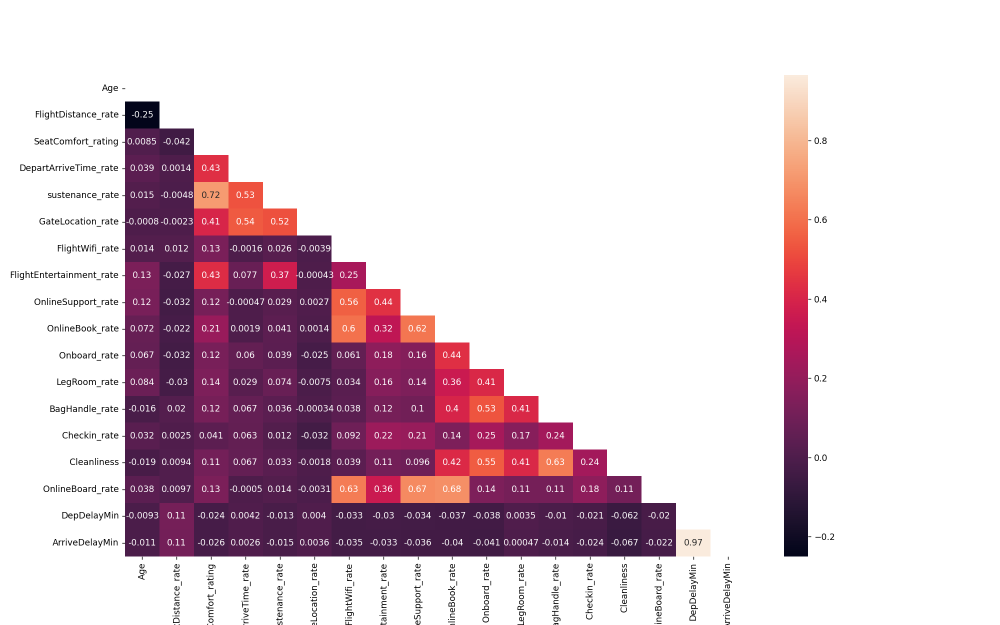

<AxesSubplot:>

In [48]:
plt.figure(figsize=(16,10))
sns.heatmap(df.corr(), mask=mask, annot=True)

With all data in the heat map, features with strongest correlations are Sustenance and seatComfort.

In [49]:
df_T = df_clean #df_T (T=True, otherwise satisfied)
df_F = df_clean #df_F (F=False, otherwise dissatisfied)

In [50]:
 df_T = df_T[df_T['satisfaction'] == "satisfied"]
df_F = df_F[df_F['satisfaction'] == "dissatisfied"]

In [51]:
#satisfied customers
mask = np.zeros_like(df_T.corr())
triangle_indices = np.triu_indices_from(mask)
mask [triangle_indices] = True

<IPython.core.display.Javascript object>


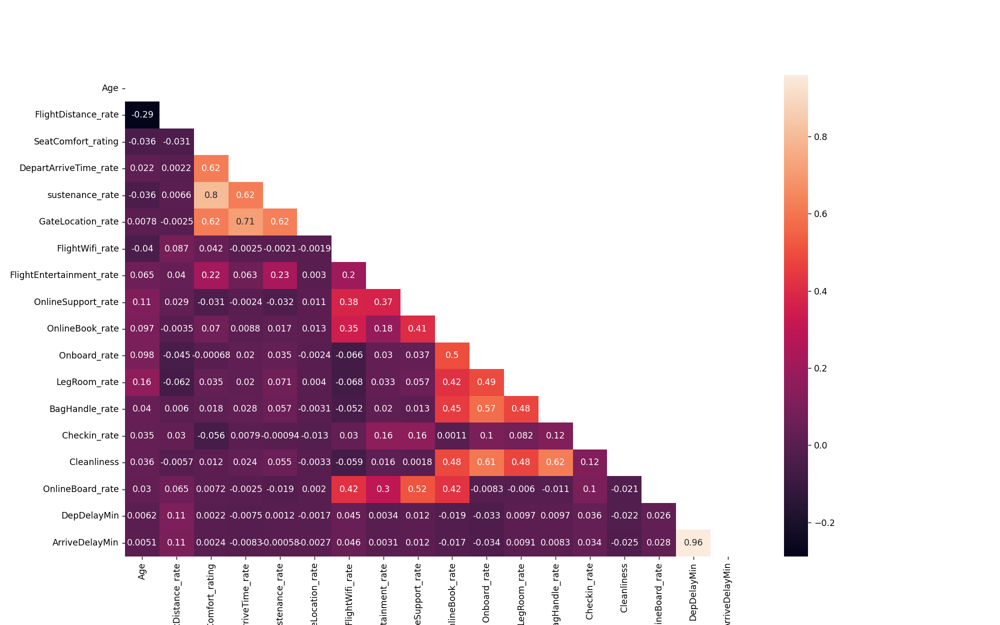

<AxesSubplot:>

In [52]:
plt.figure(figsize=(16,10))
sns.heatmap(df_sat.corr(), mask=mask, annot=True)

Satisfied customers show strong correlation in DepartArriveTime, Sustenance, GateLocation, ComfortRating,

In [53]:
#unsatisfied customers
mask = np.zeros_like(df_F.corr())
triangle_indices = np.triu_indices_from(mask)
mask [triangle_indices] = True

<IPython.core.display.Javascript object>


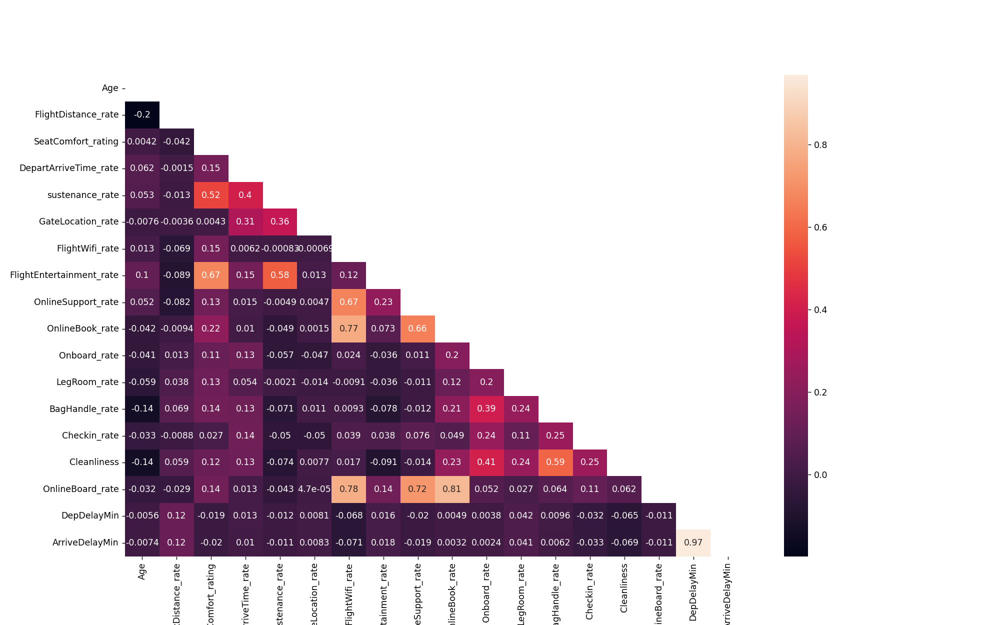

<AxesSubplot:>

In [54]:
plt.figure(figsize=(16,10))
sns.heatmap(df_unsat.corr(), mask=mask, annot=True)

Disatisfied Customers showed strong correlations for OnlineBoard_Rate, Flight_WiFi, Online_Book_rate, FlightEntertainment_rate and DepDelayMin.

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Visualizing Data for Inbalances in feature column <h3>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [56]:
!pip install pandas-profiling

In [57]:
import pandas_profiling

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


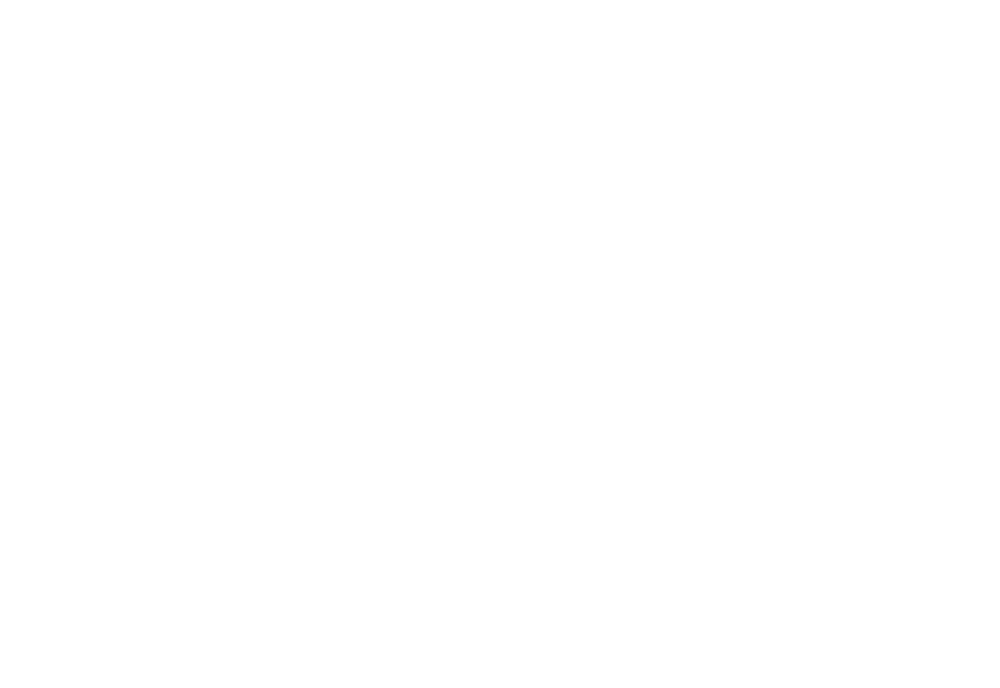

<IPython.core.display.Javascript object>


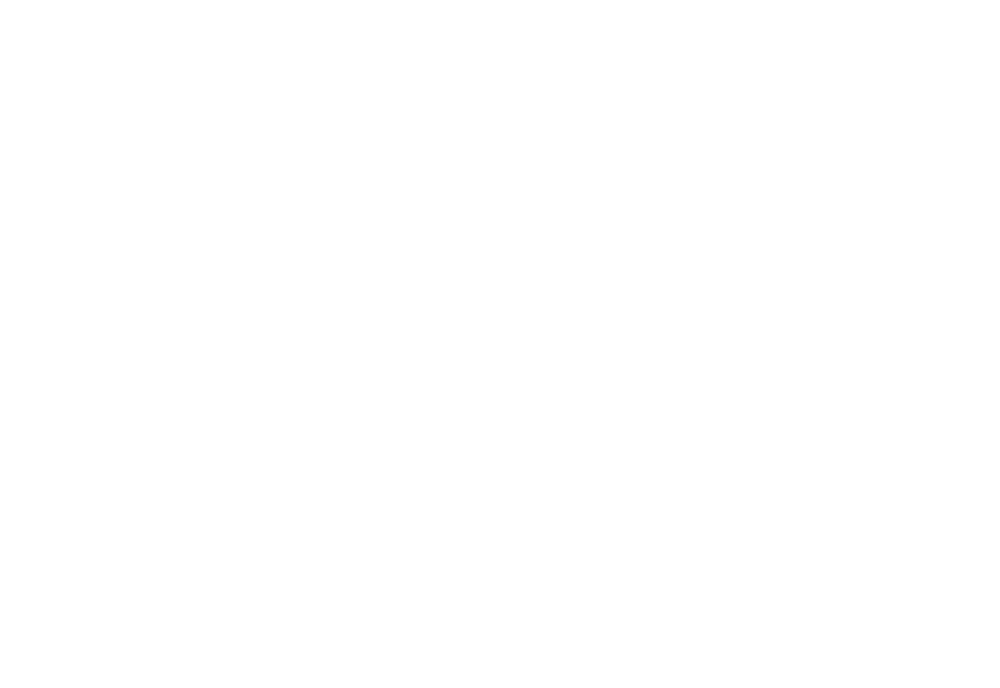

<IPython.core.display.Javascript object>


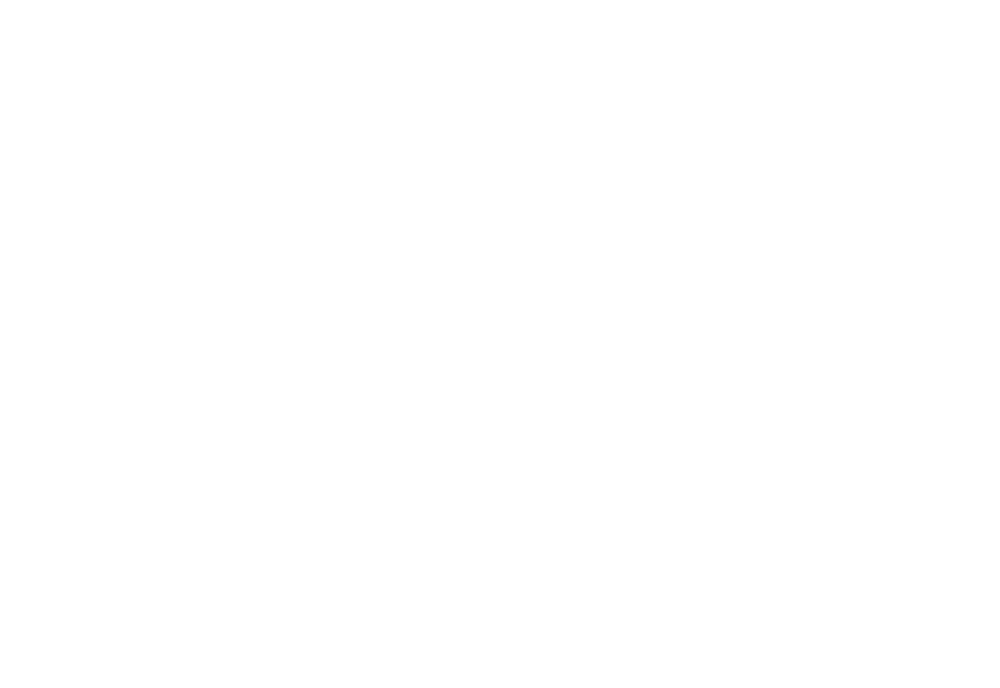

<IPython.core.display.Javascript object>


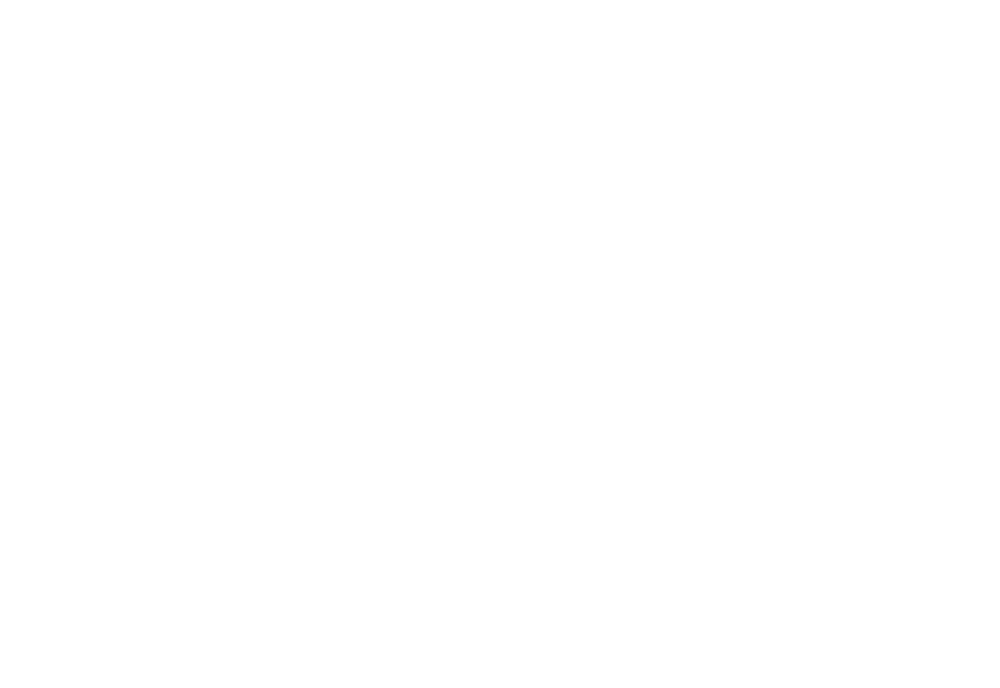

<IPython.core.display.Javascript object>


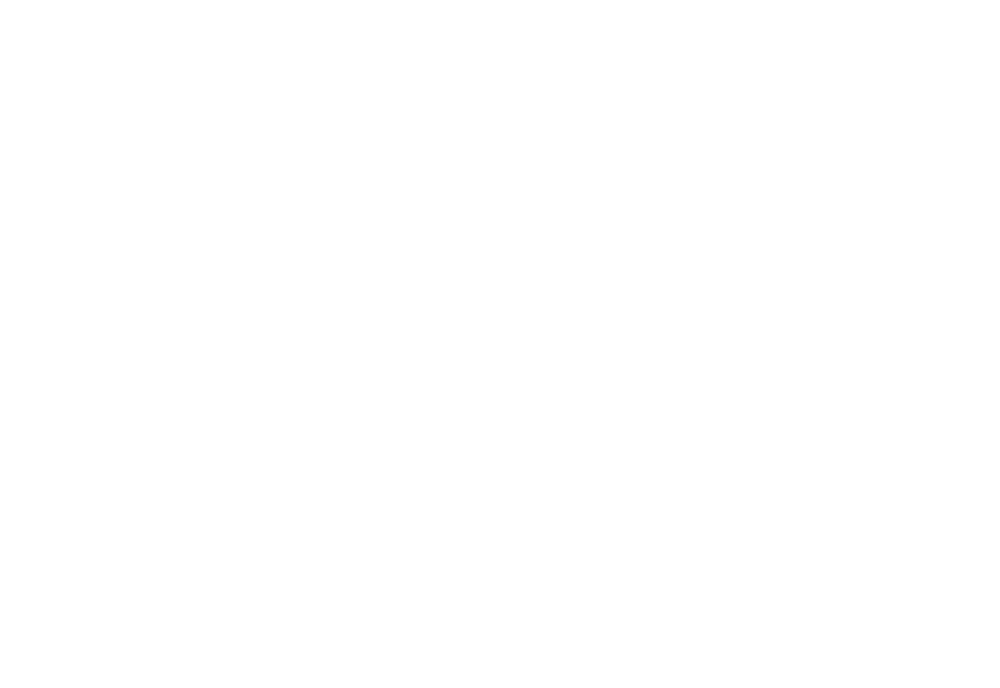

<IPython.core.display.Javascript object>


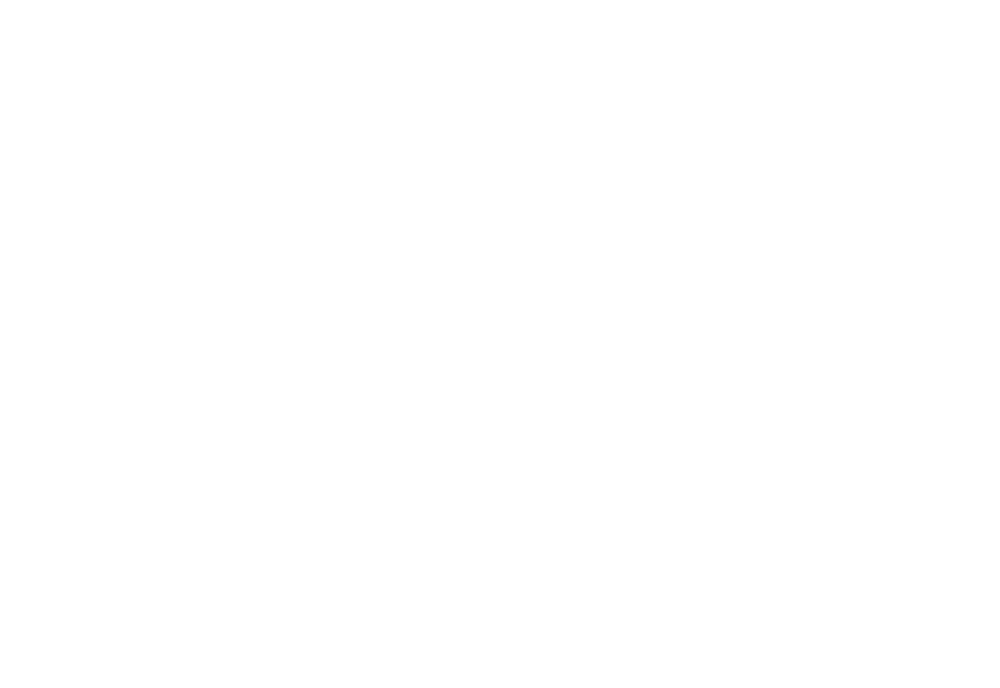

<IPython.core.display.Javascript object>


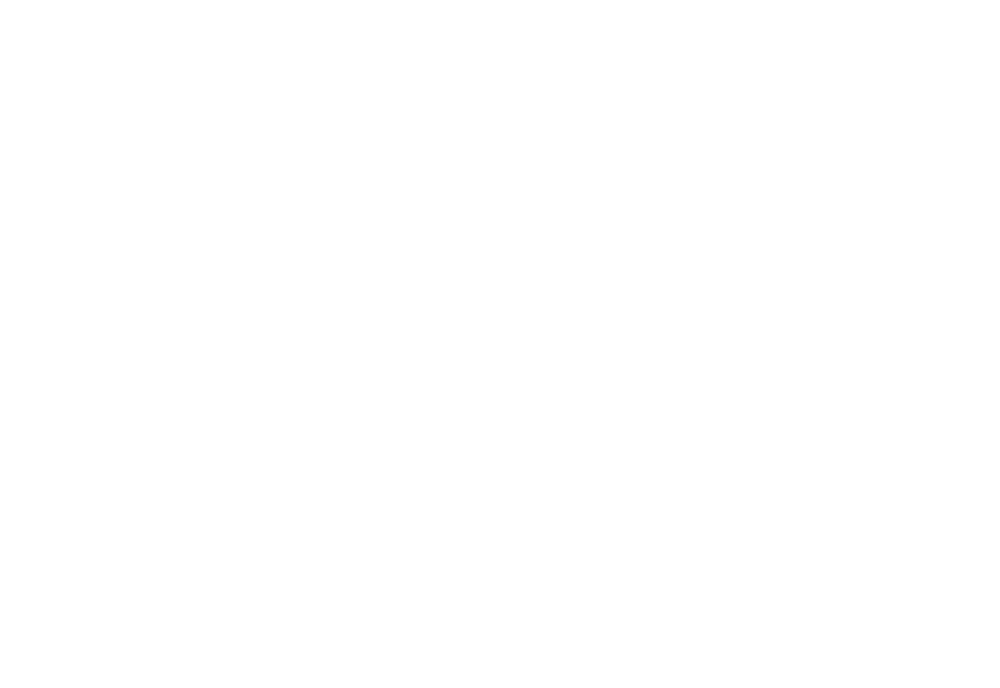

<IPython.core.display.Javascript object>


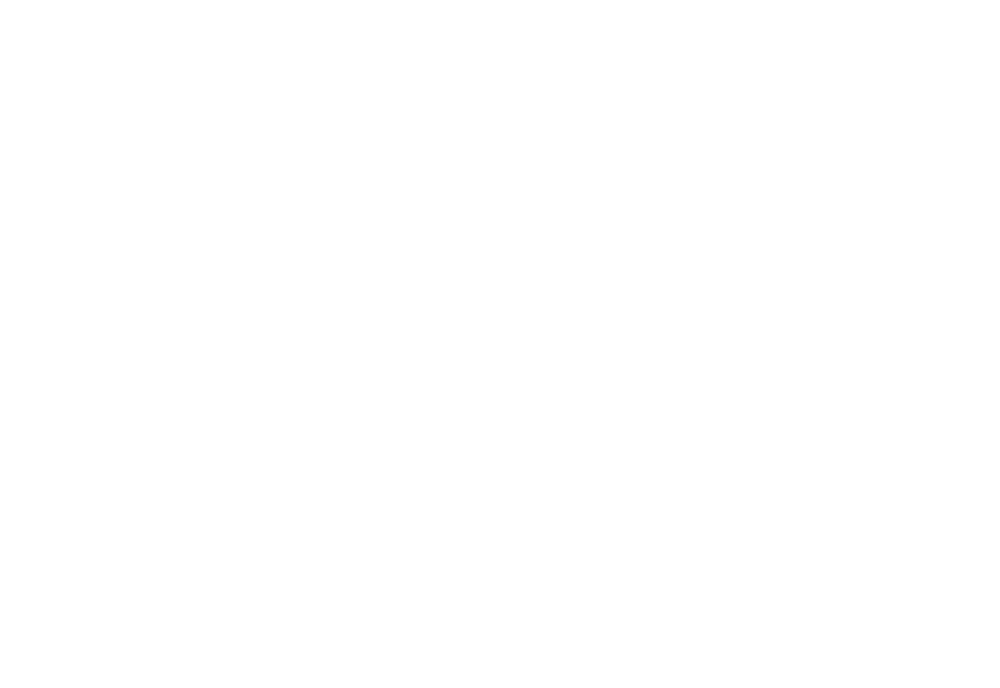

<IPython.core.display.Javascript object>


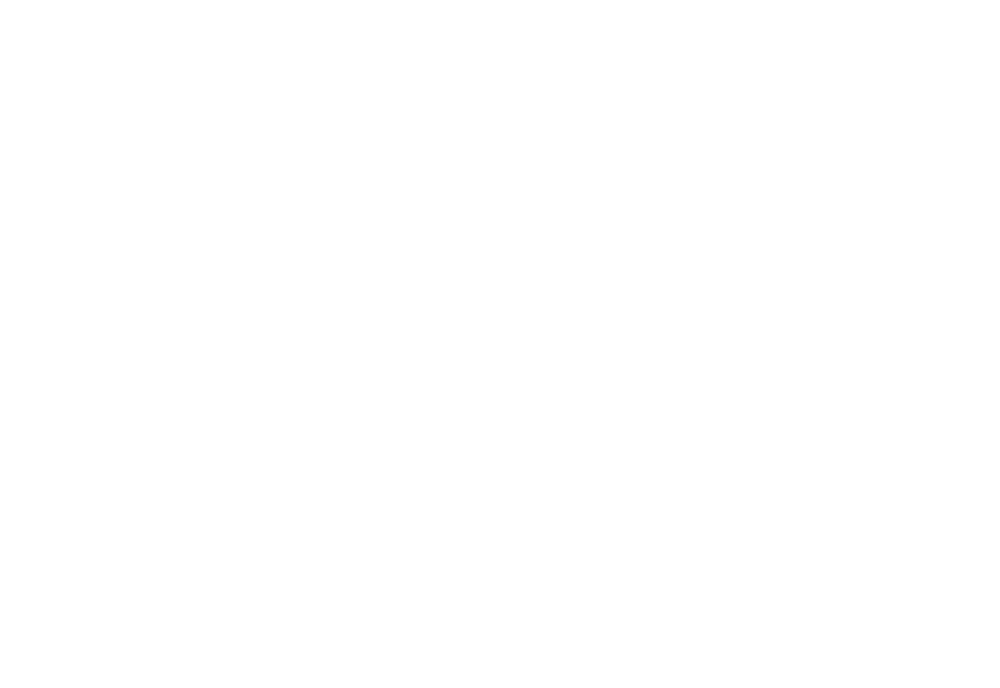

<IPython.core.display.Javascript object>


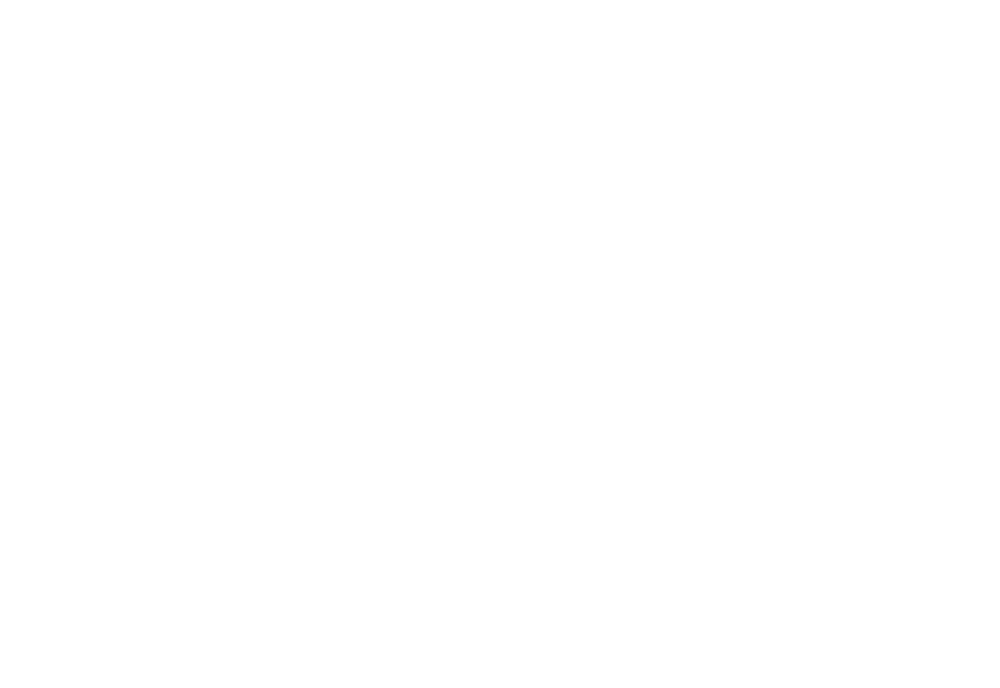

<IPython.core.display.Javascript object>


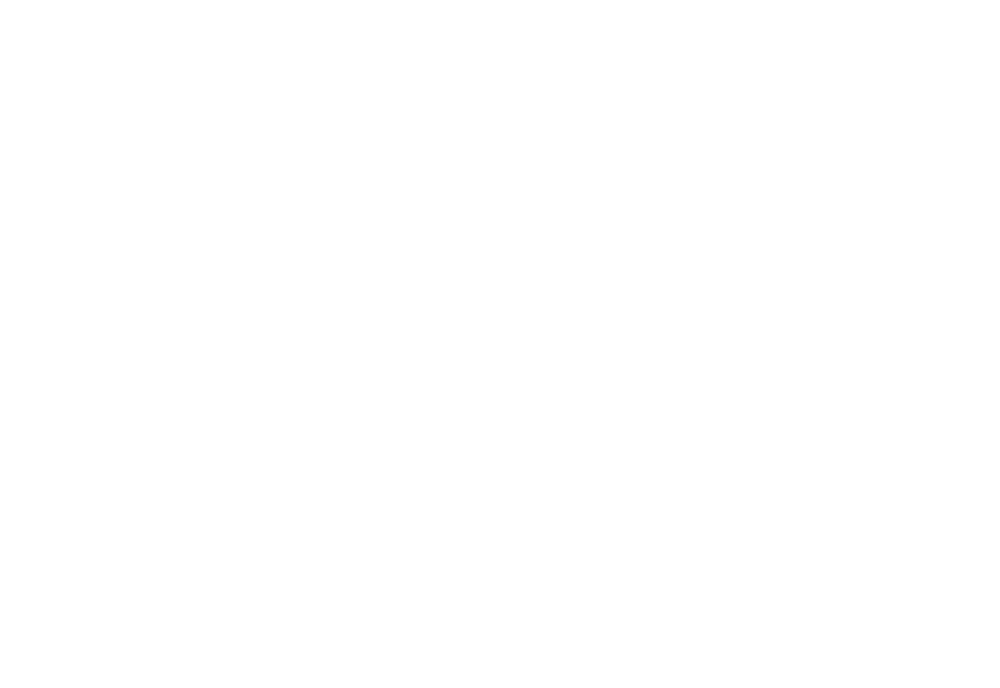

<IPython.core.display.Javascript object>


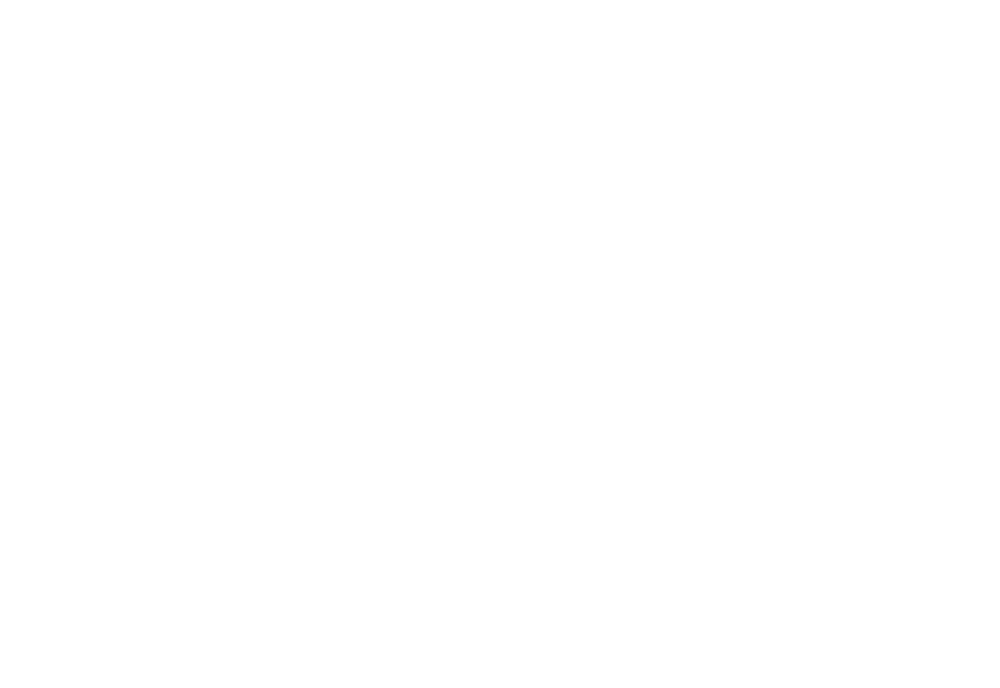

<IPython.core.display.Javascript object>


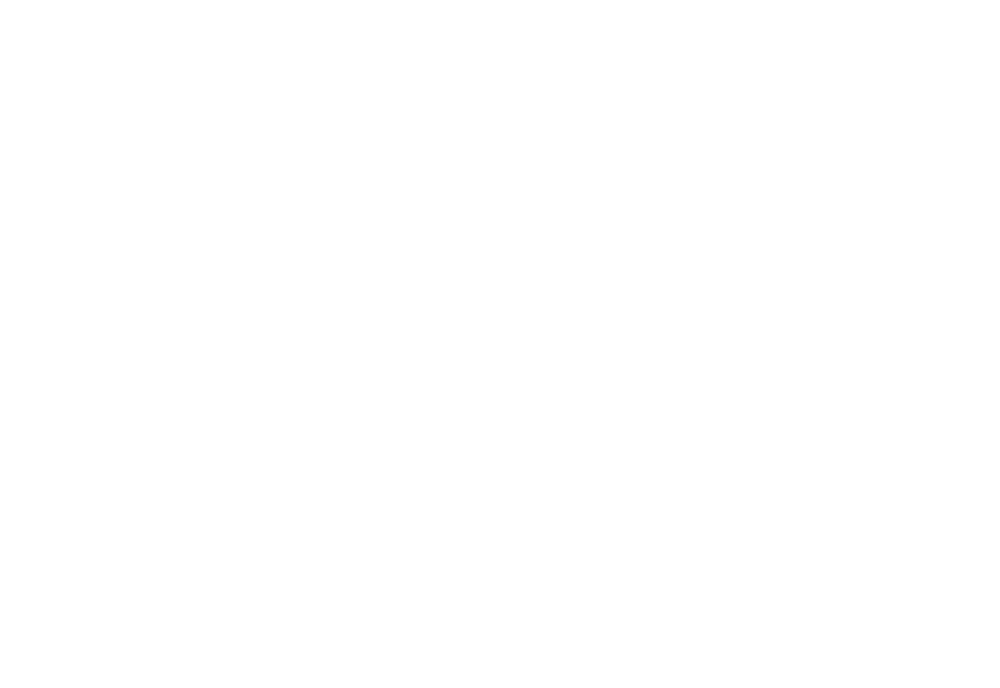

<IPython.core.display.Javascript object>


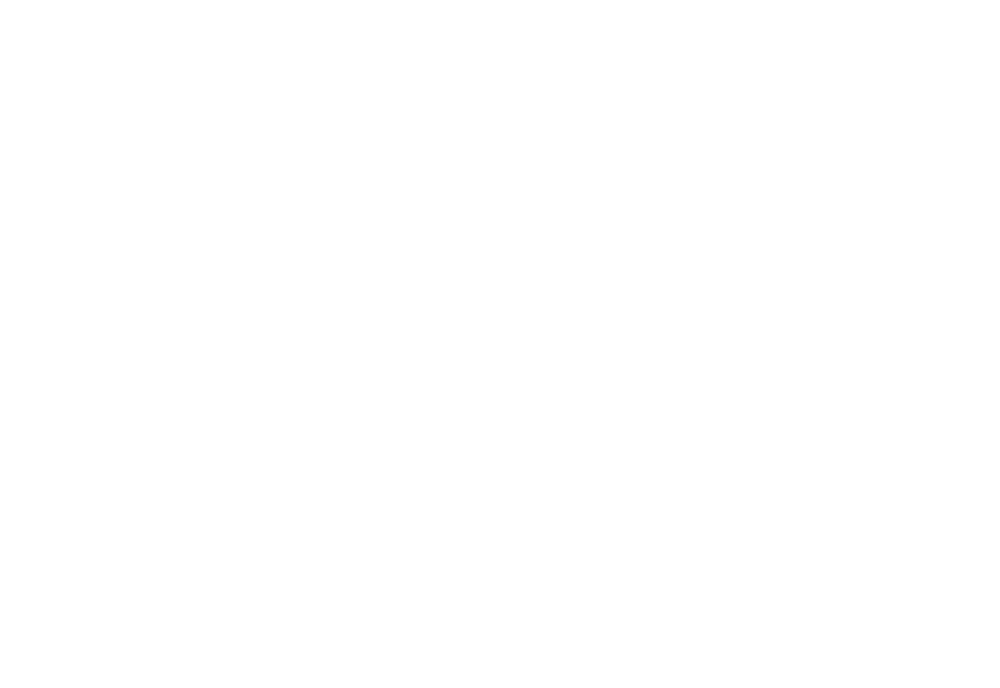

<IPython.core.display.Javascript object>


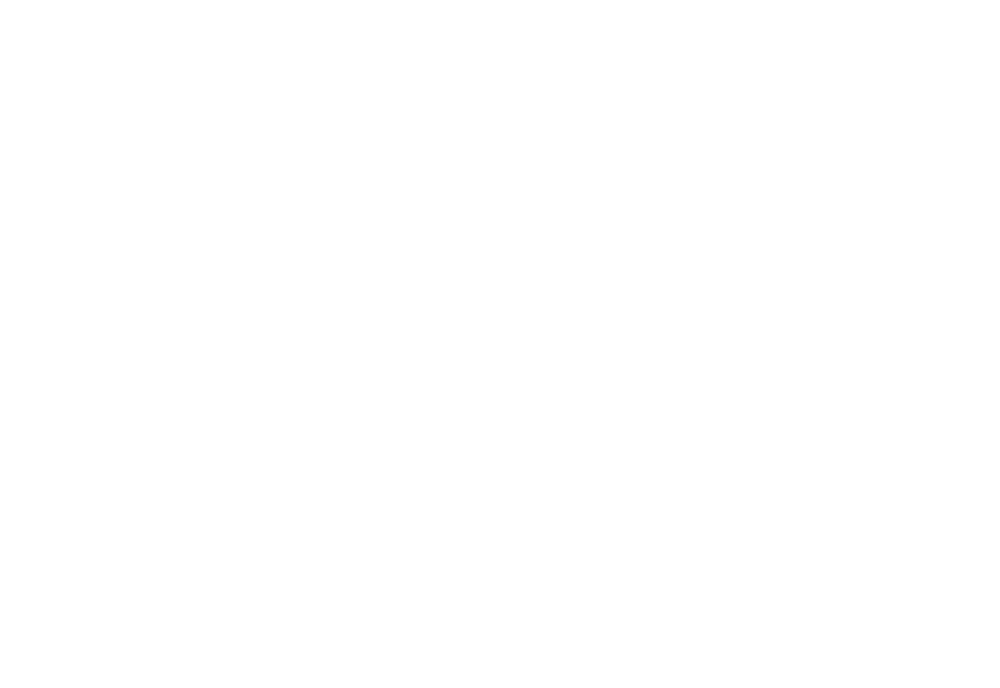

<IPython.core.display.Javascript object>


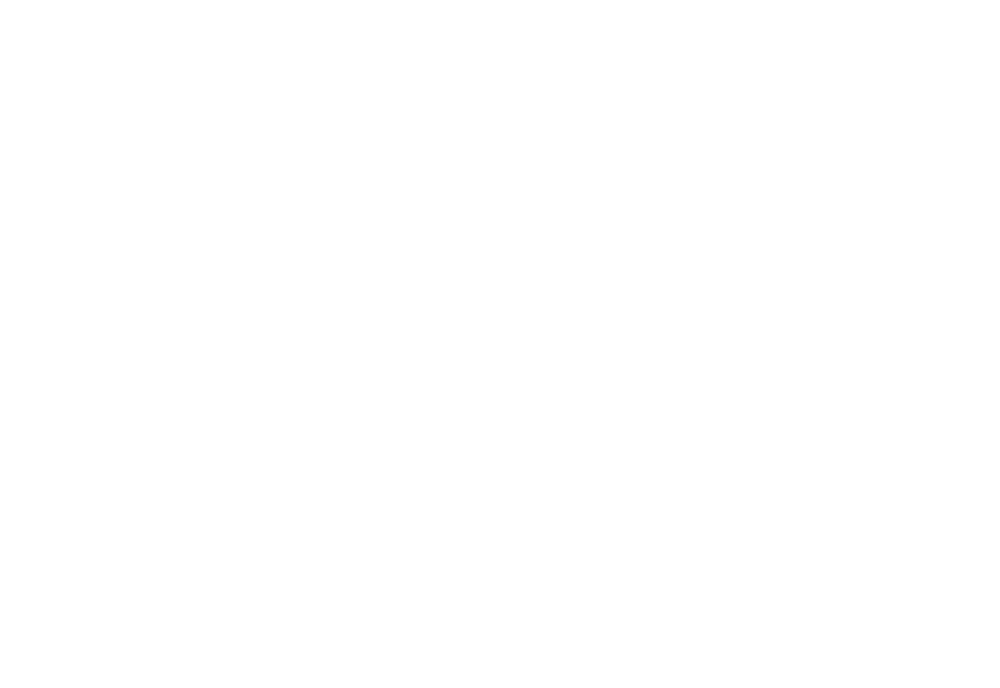

<IPython.core.display.Javascript object>


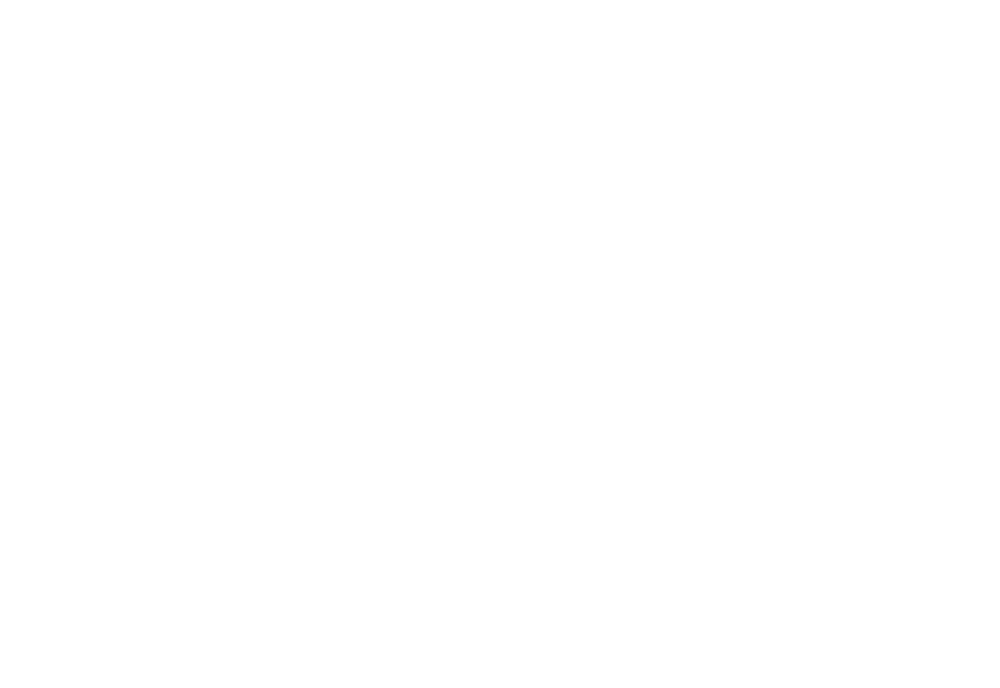

<IPython.core.display.Javascript object>


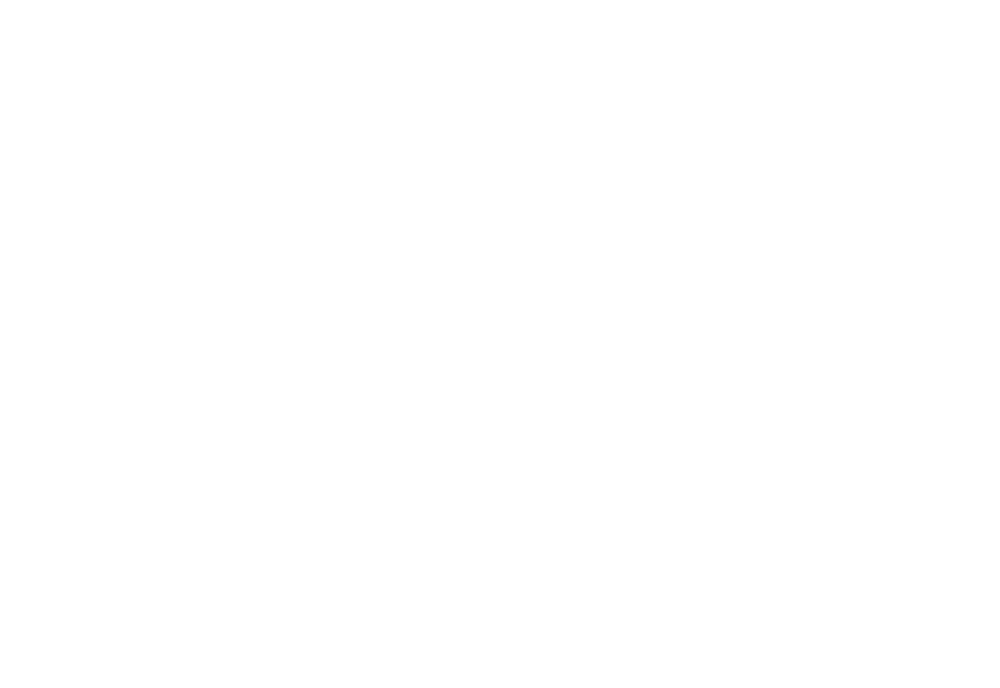

<IPython.core.display.Javascript object>


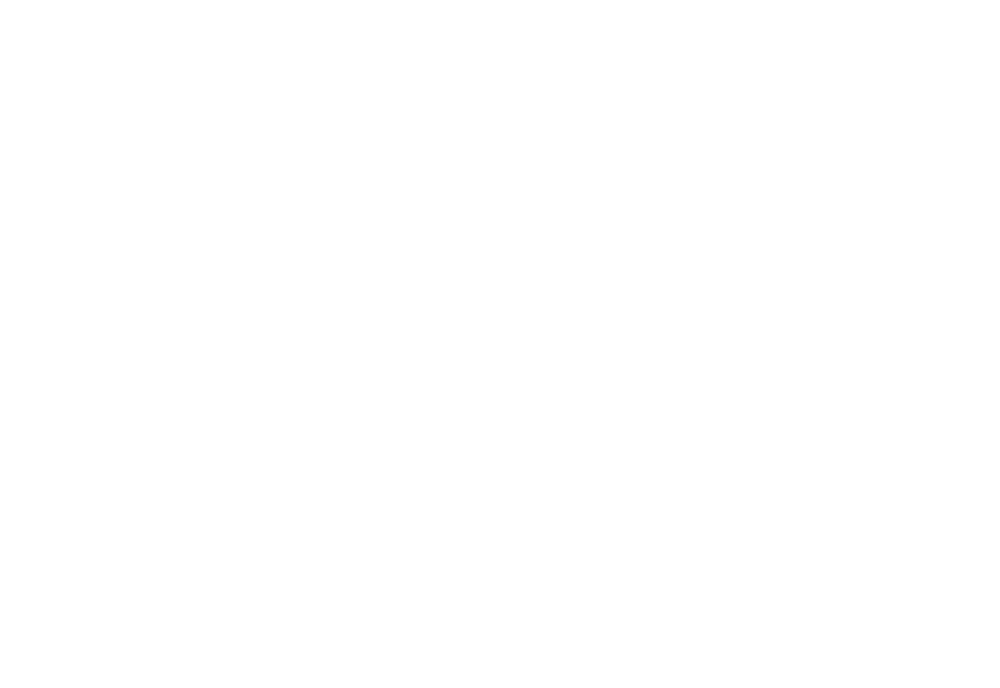

<IPython.core.display.Javascript object>


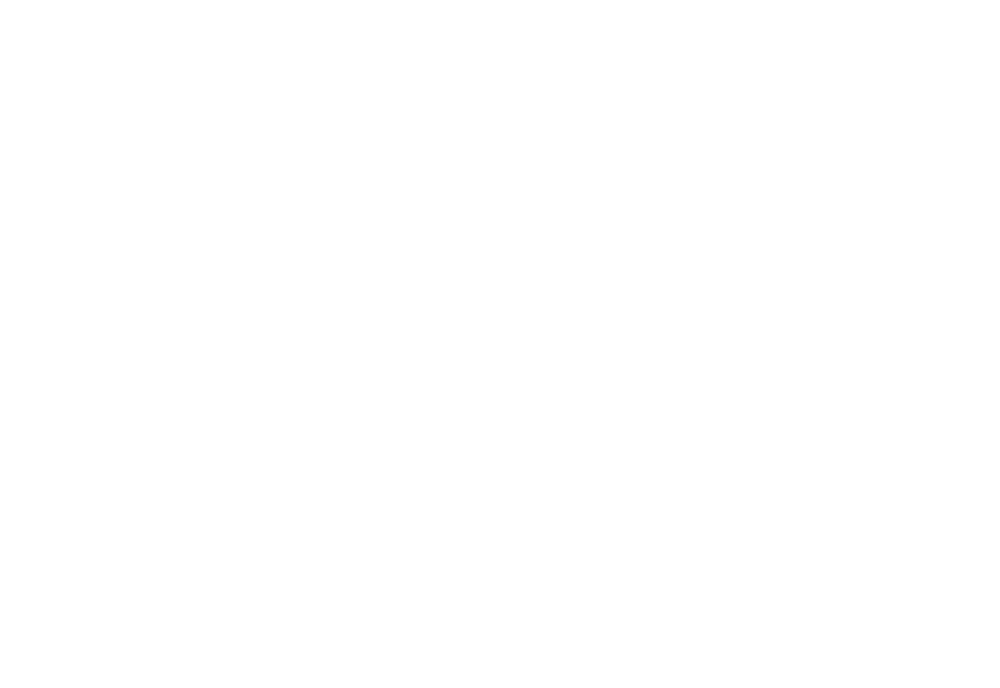

<IPython.core.display.Javascript object>


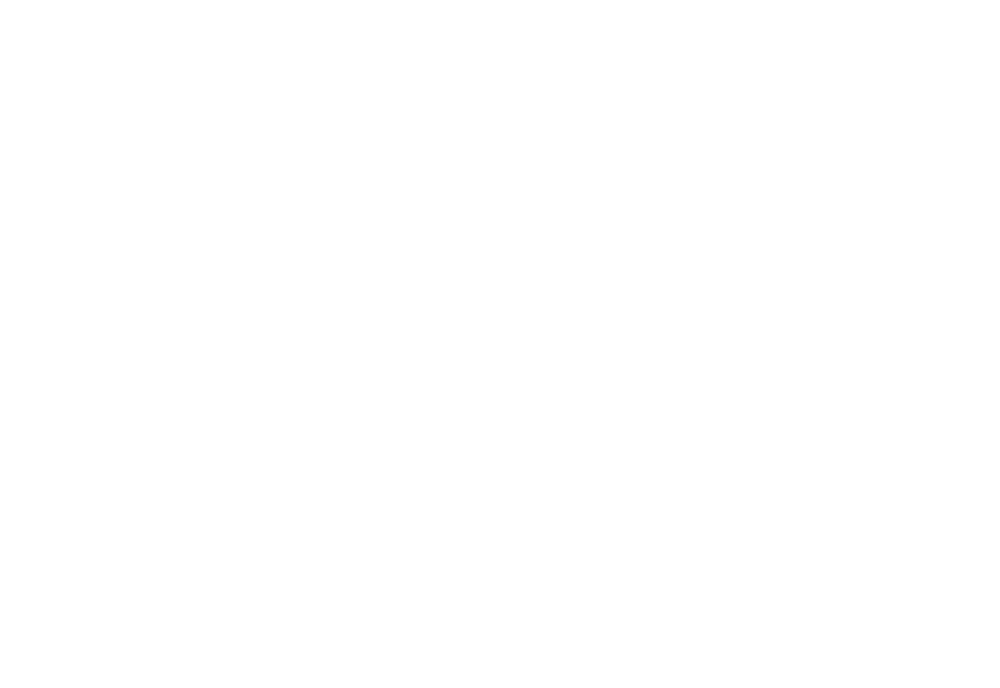

<IPython.core.display.Javascript object>


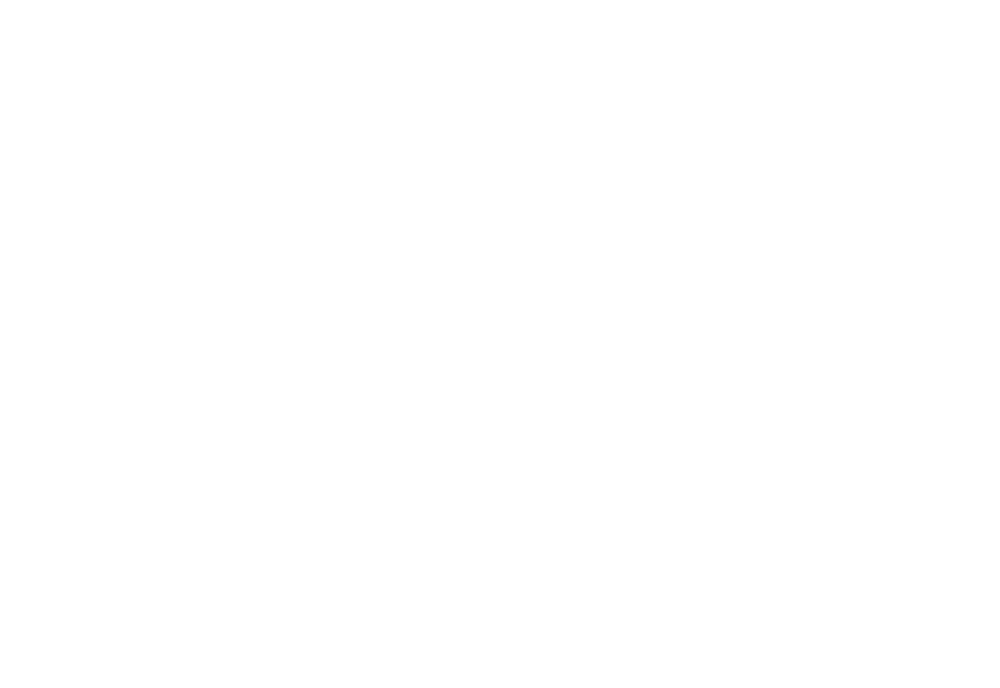

<IPython.core.display.Javascript object>


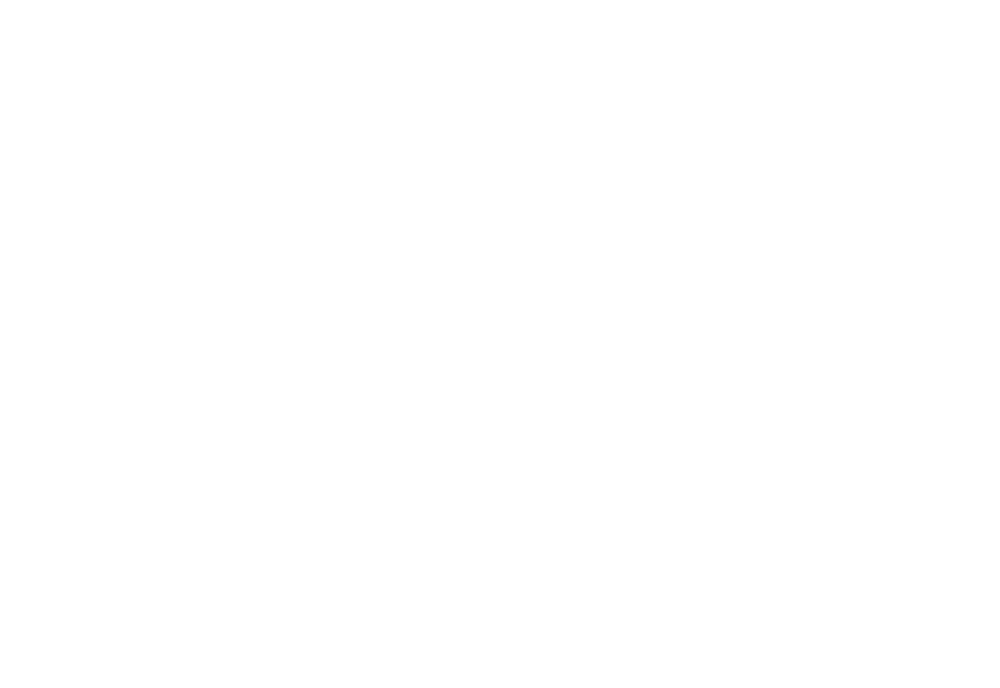

<IPython.core.display.Javascript object>


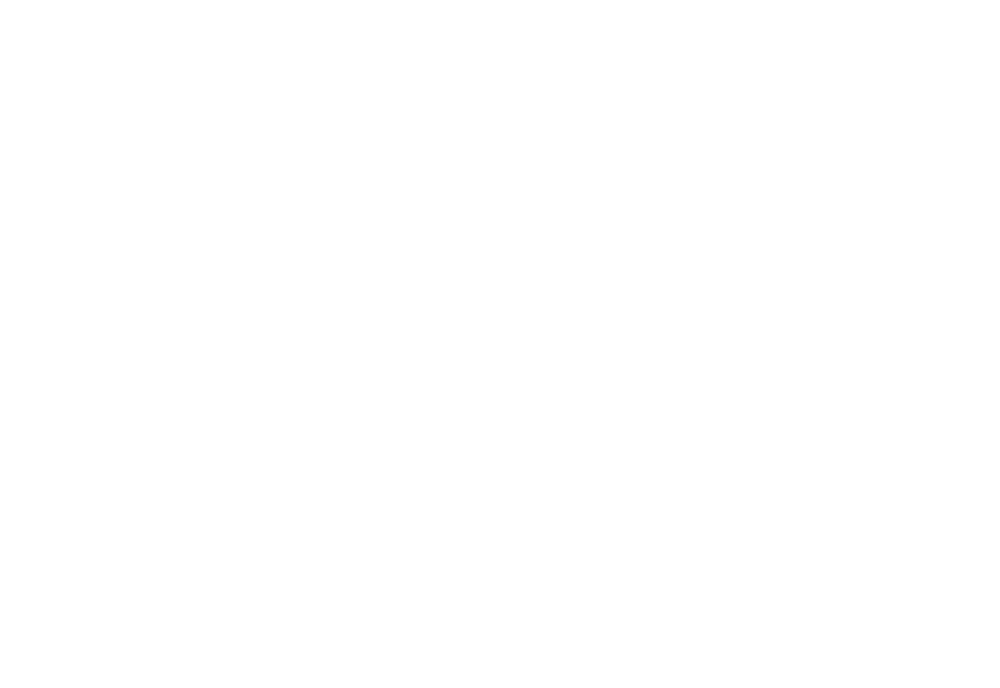

<IPython.core.display.Javascript object>


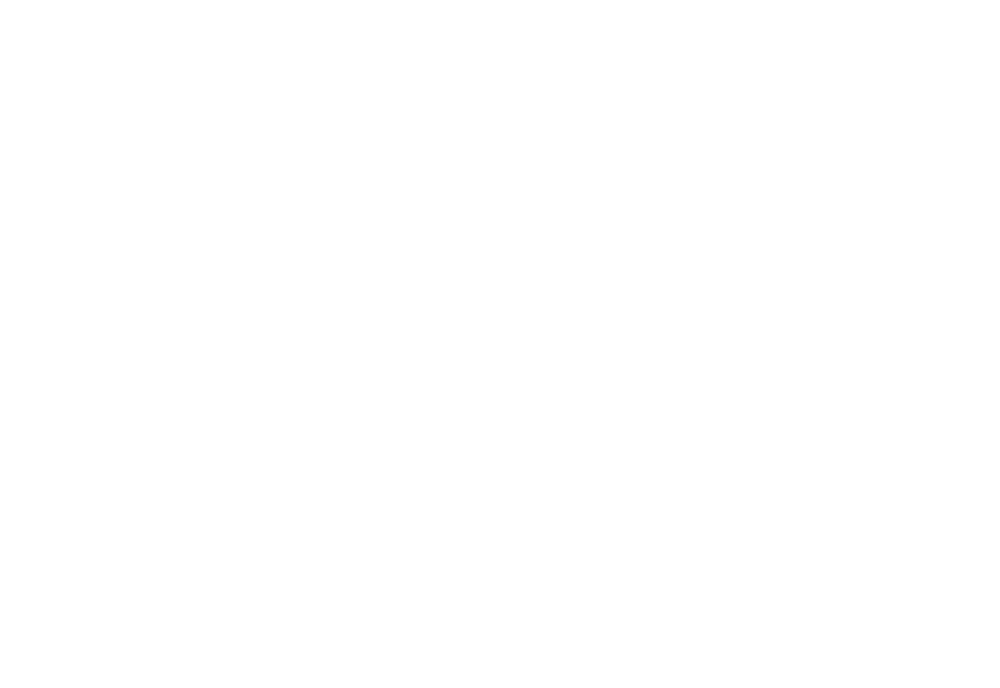

<IPython.core.display.Javascript object>


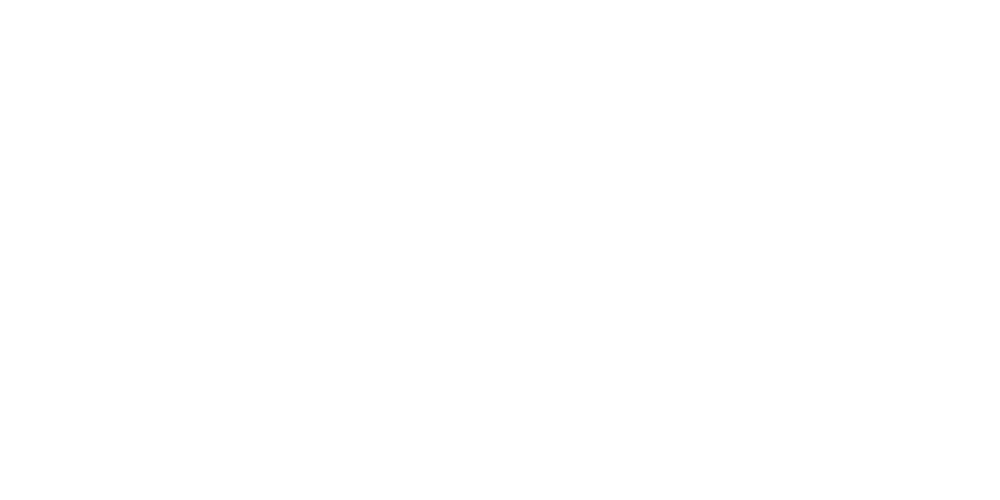

<IPython.core.display.Javascript object>


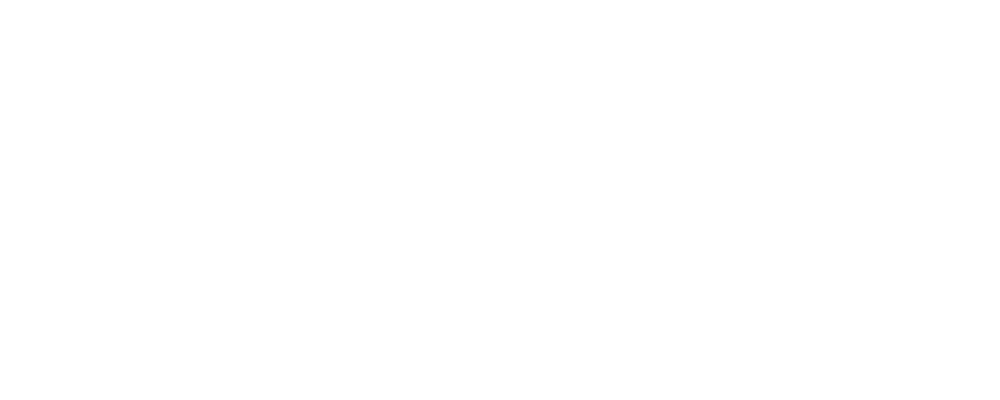

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

<IPython.core.display.Javascript object>


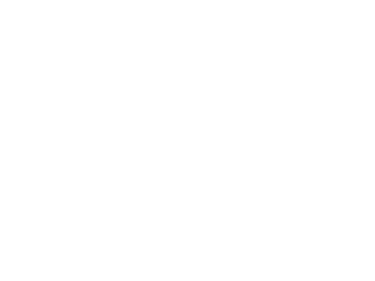

<IPython.core.display.Javascript object>


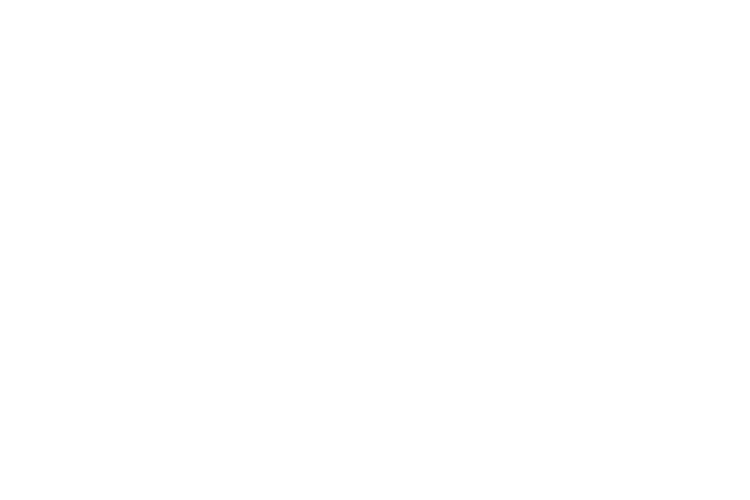

<IPython.core.display.Javascript object>


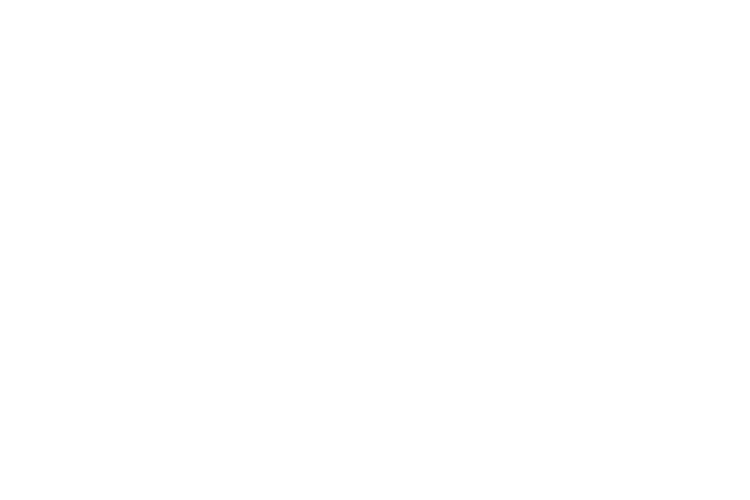

<IPython.core.display.Javascript object>


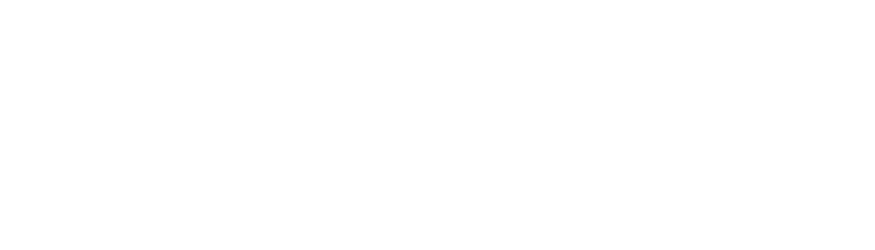

<IPython.core.display.Javascript object>


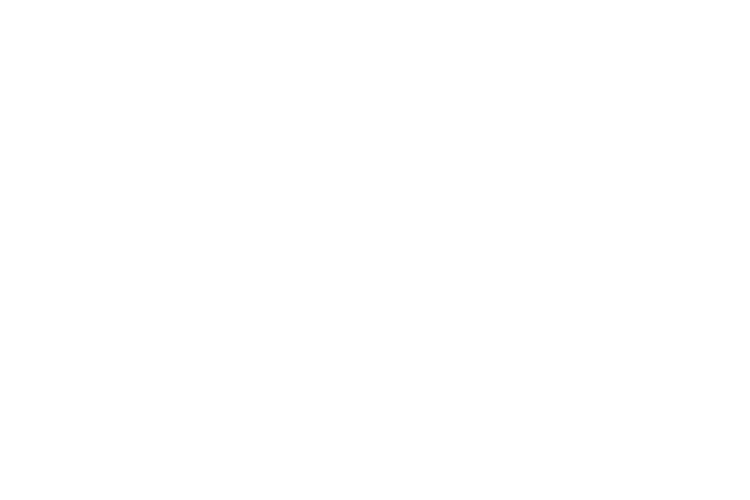

<IPython.core.display.Javascript object>


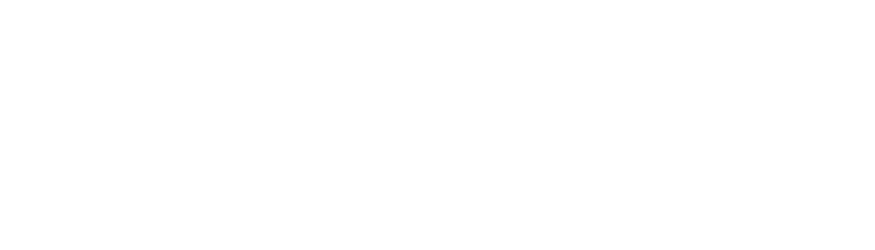

<IPython.core.display.Javascript object>


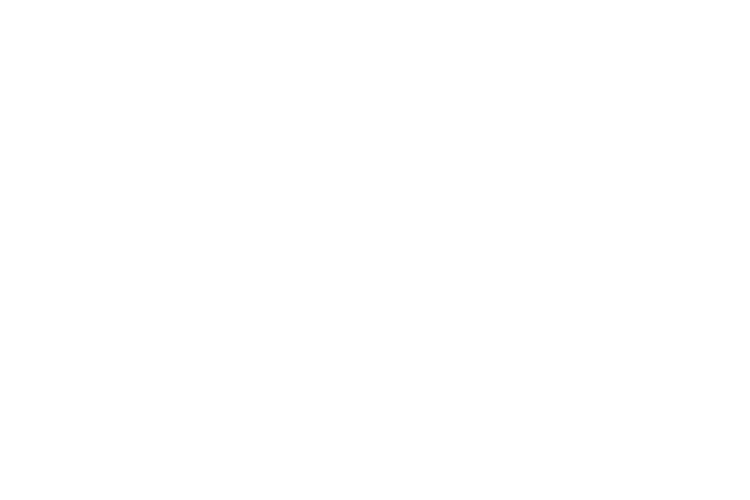

<IPython.core.display.Javascript object>


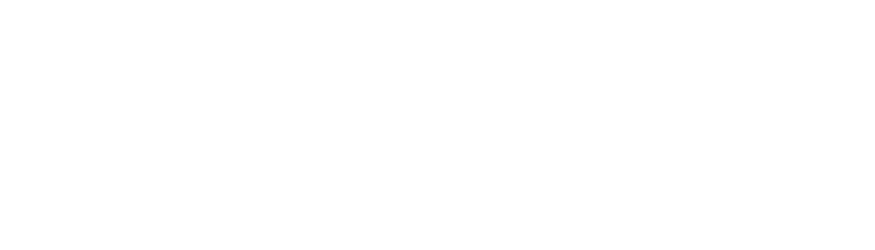

<IPython.core.display.Javascript object>


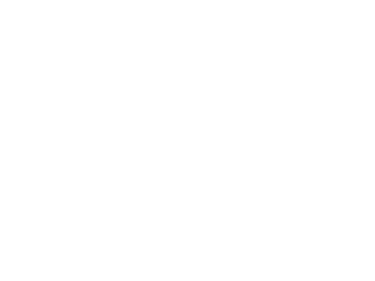

<IPython.core.display.Javascript object>


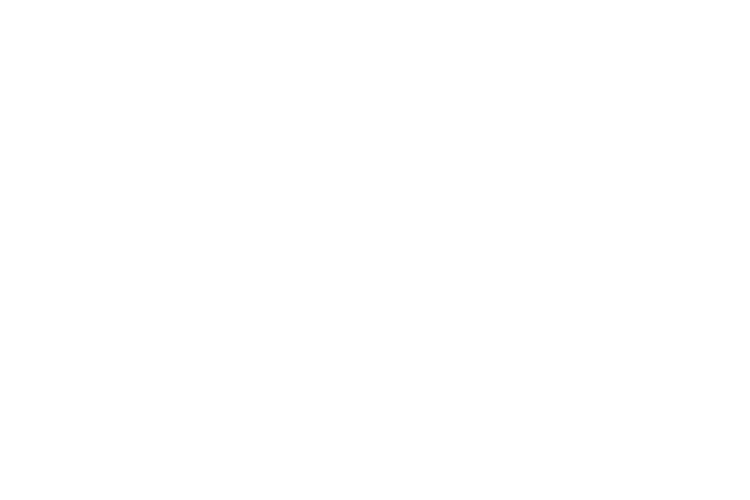

<IPython.core.display.Javascript object>


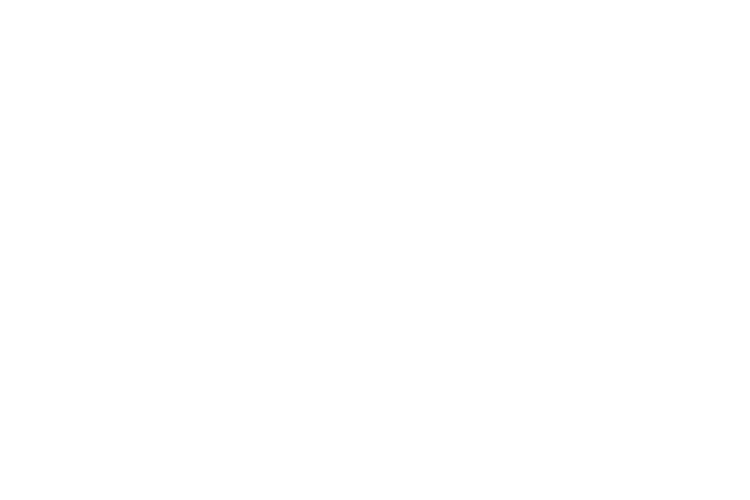

<IPython.core.display.Javascript object>


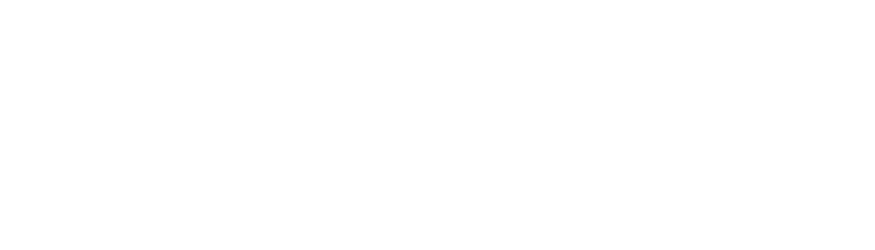

<IPython.core.display.Javascript object>


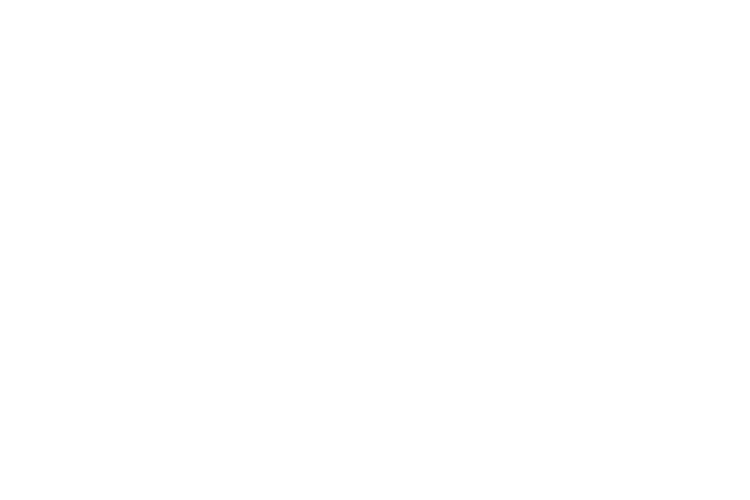

<IPython.core.display.Javascript object>


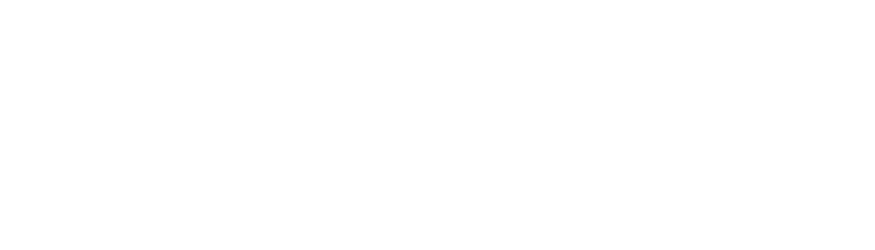

<IPython.core.display.Javascript object>


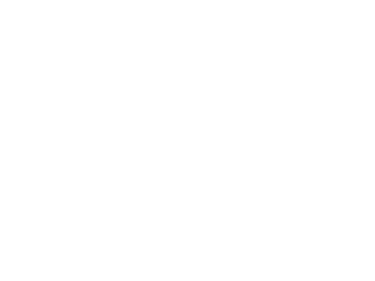

<IPython.core.display.Javascript object>


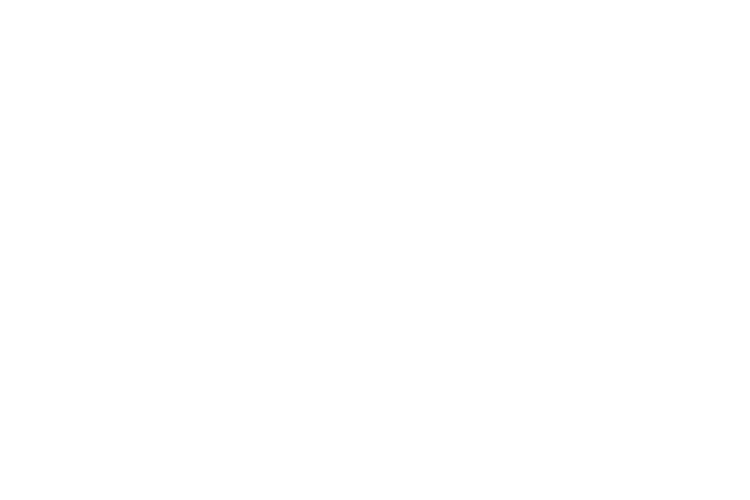

<IPython.core.display.Javascript object>


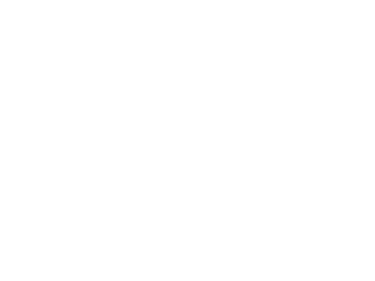

<IPython.core.display.Javascript object>


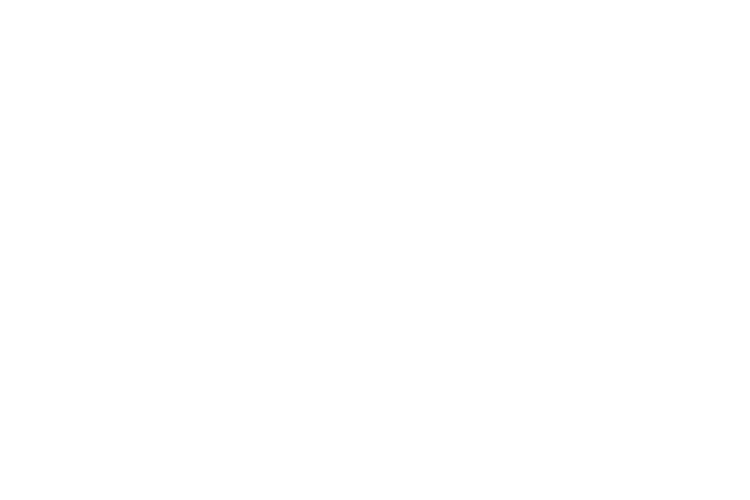

<IPython.core.display.Javascript object>


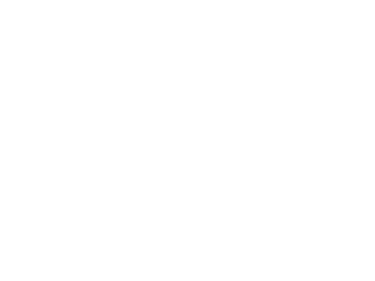

<IPython.core.display.Javascript object>


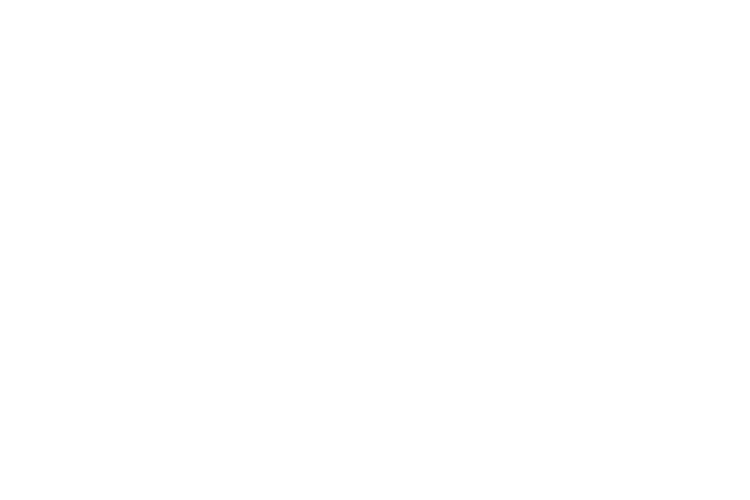

<IPython.core.display.Javascript object>


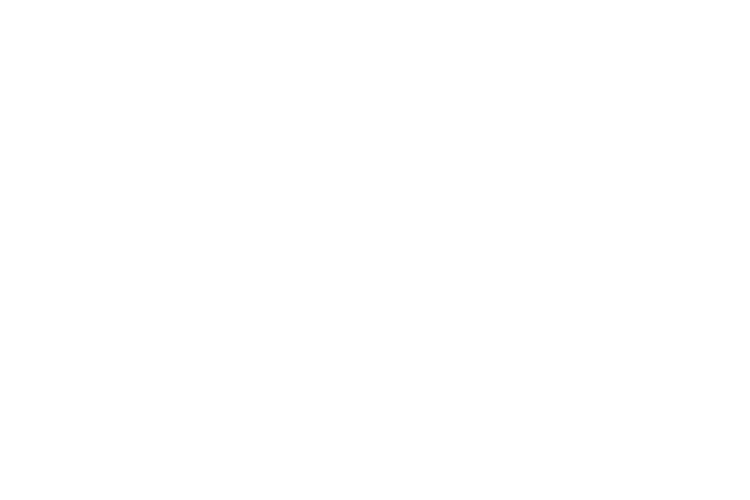

<IPython.core.display.Javascript object>


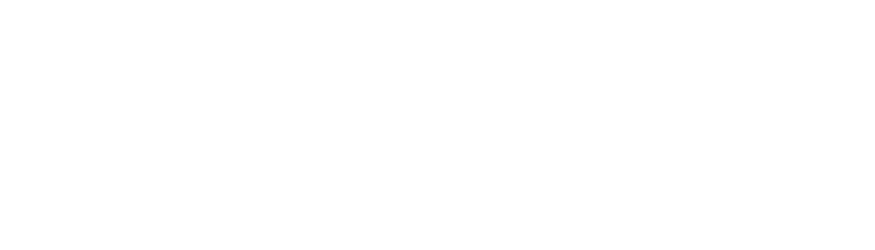

<IPython.core.display.Javascript object>


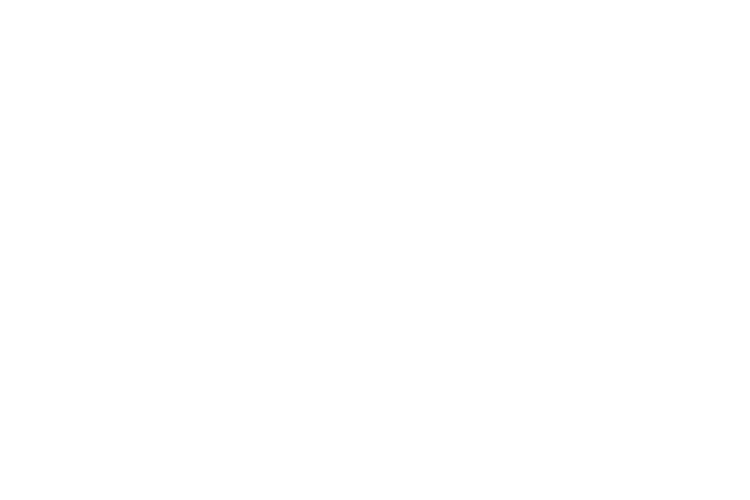

<IPython.core.display.Javascript object>


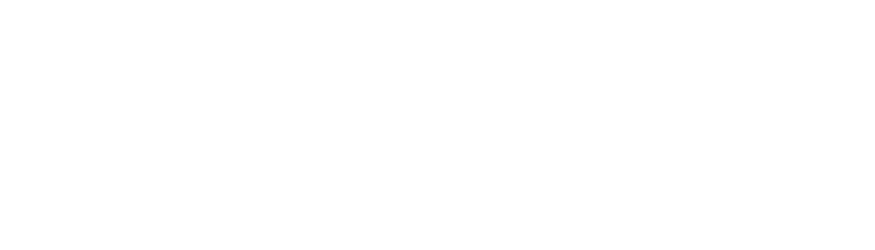

<IPython.core.display.Javascript object>


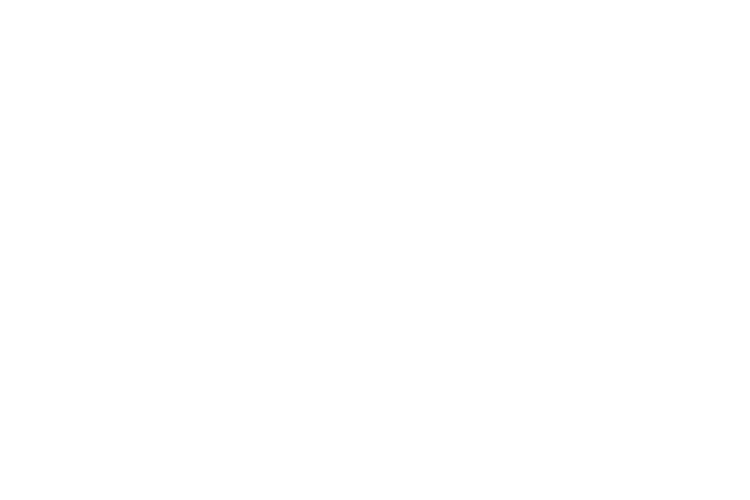

<IPython.core.display.Javascript object>


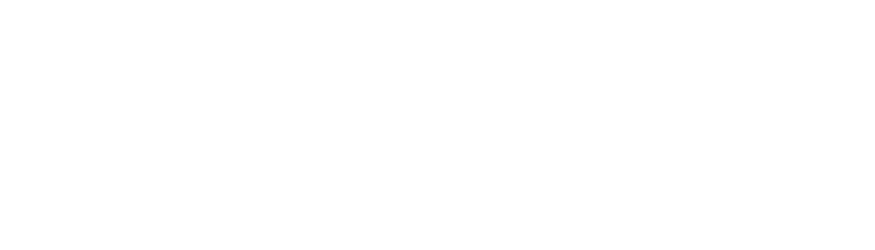

<IPython.core.display.Javascript object>


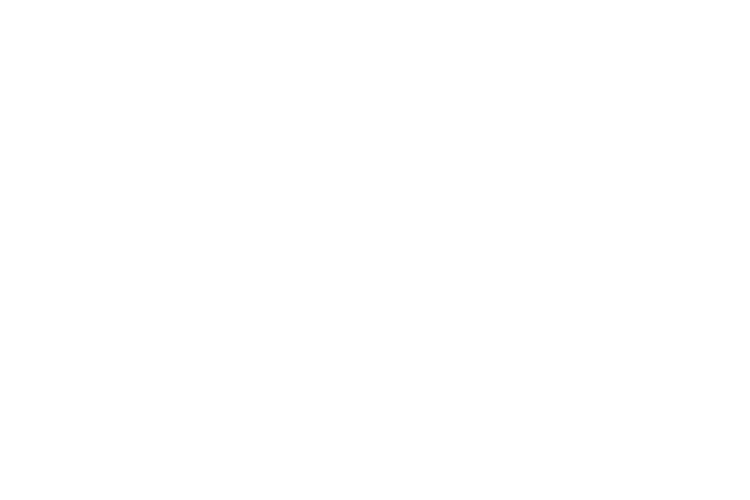

<IPython.core.display.Javascript object>


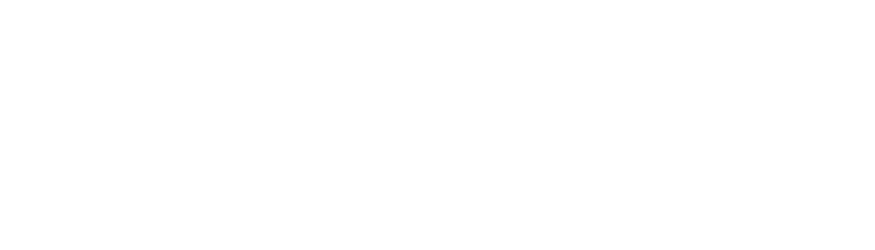

<IPython.core.display.Javascript object>


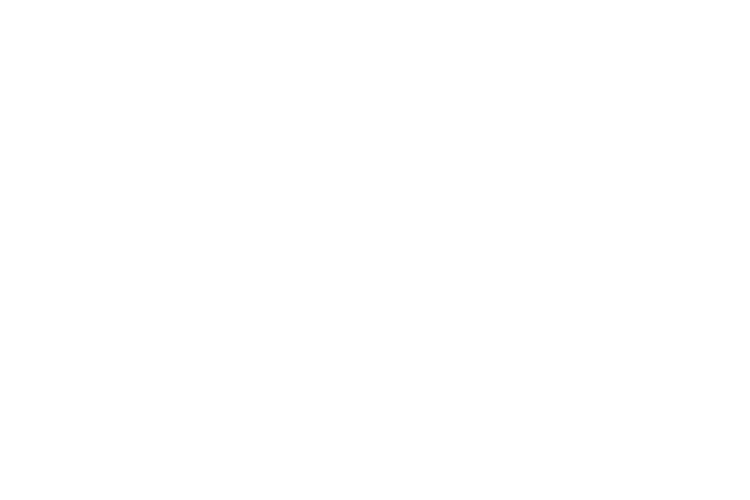

<IPython.core.display.Javascript object>


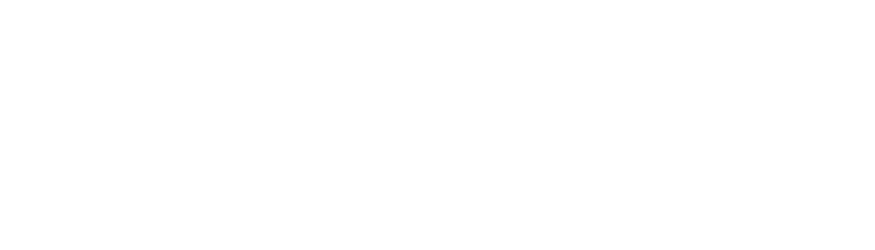

<IPython.core.display.Javascript object>


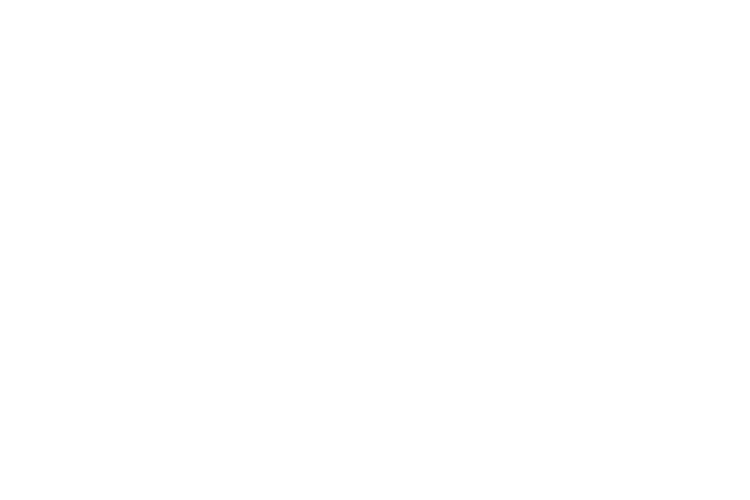

<IPython.core.display.Javascript object>


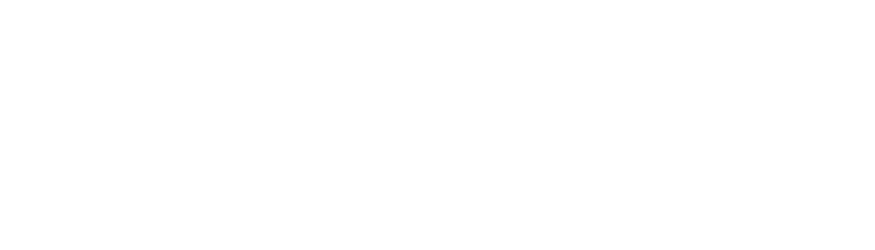

<IPython.core.display.Javascript object>


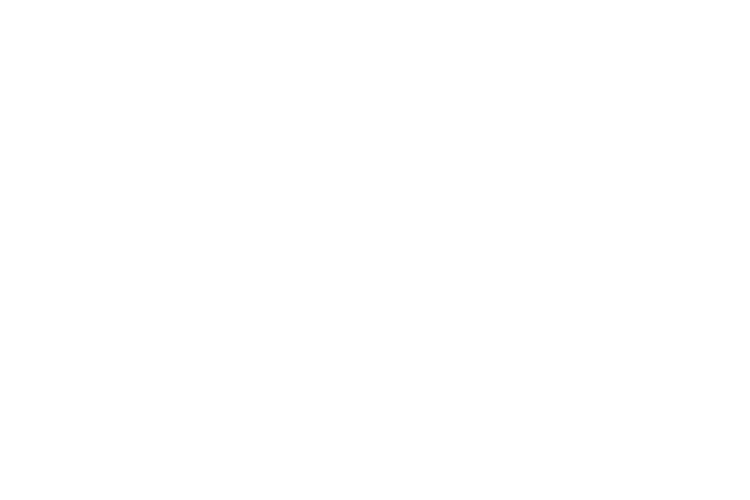

<IPython.core.display.Javascript object>


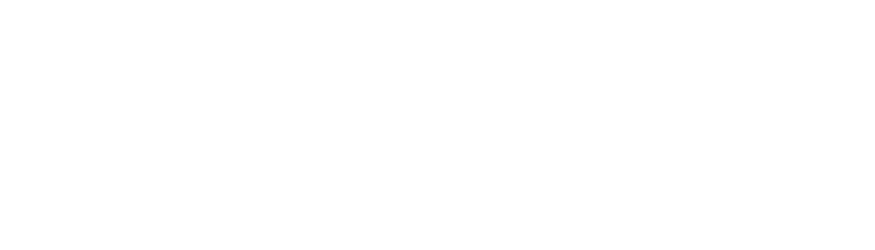

<IPython.core.display.Javascript object>


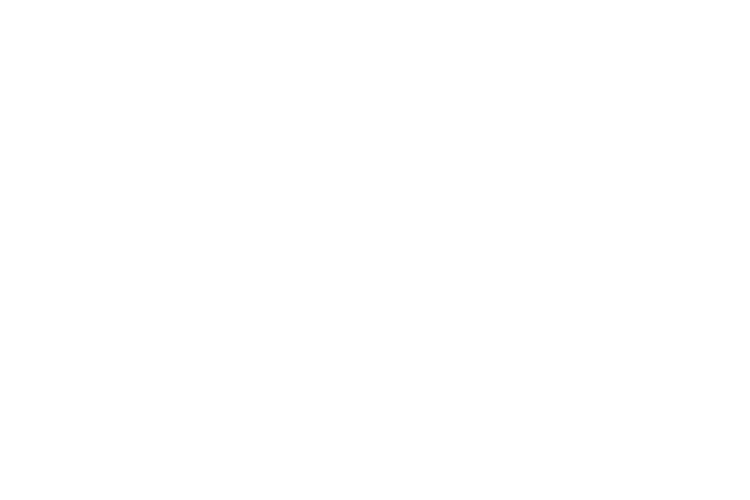

<IPython.core.display.Javascript object>


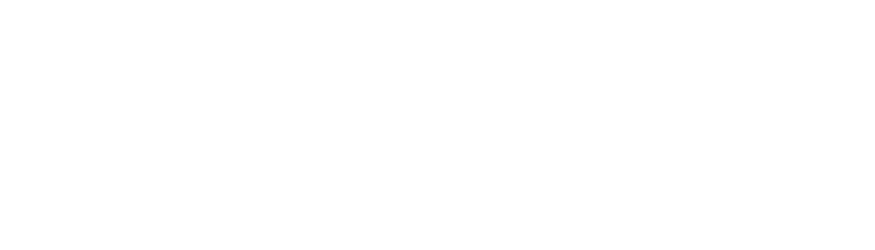

<IPython.core.display.Javascript object>


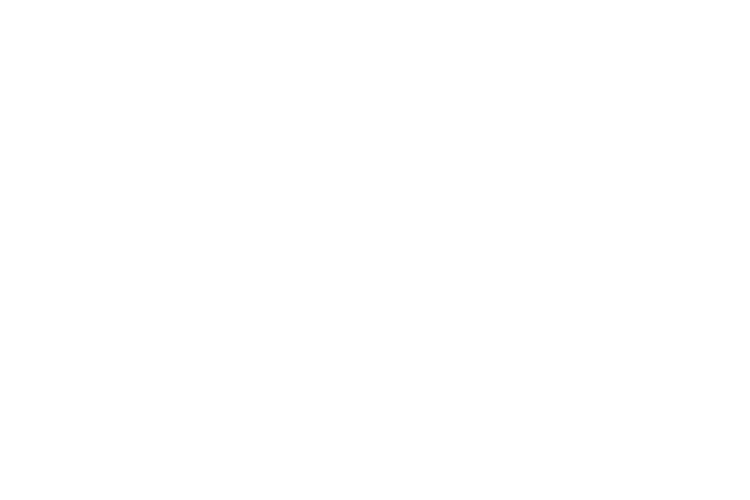

<IPython.core.display.Javascript object>


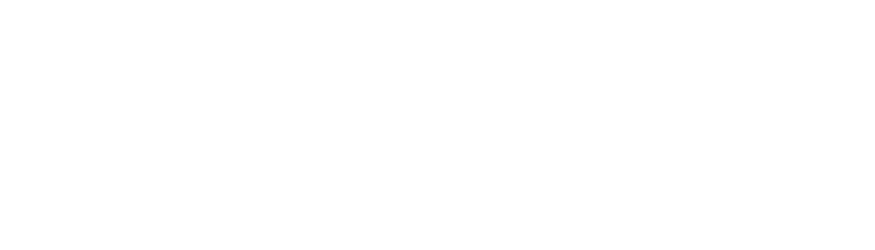

<IPython.core.display.Javascript object>


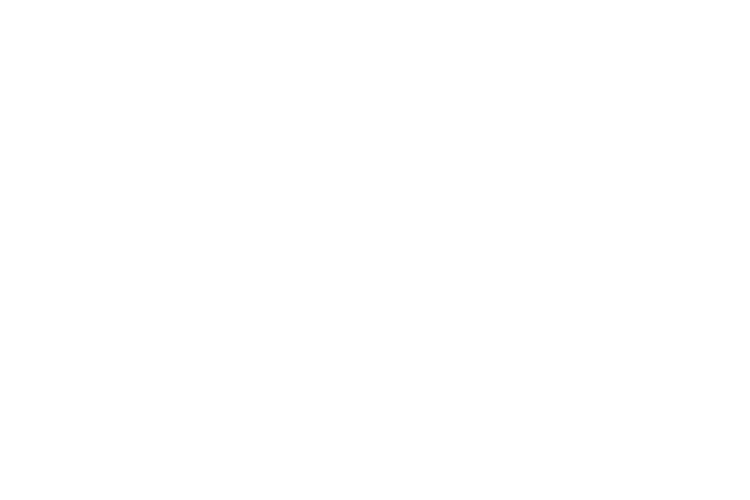

<IPython.core.display.Javascript object>


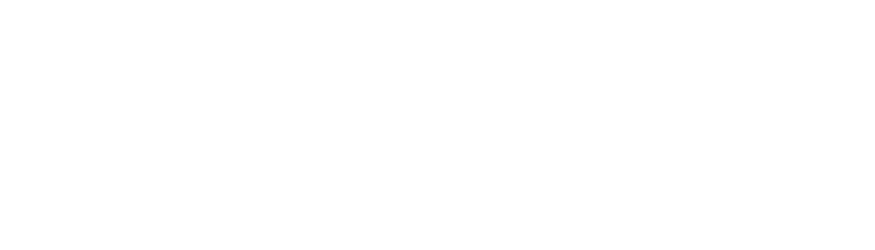

<IPython.core.display.Javascript object>


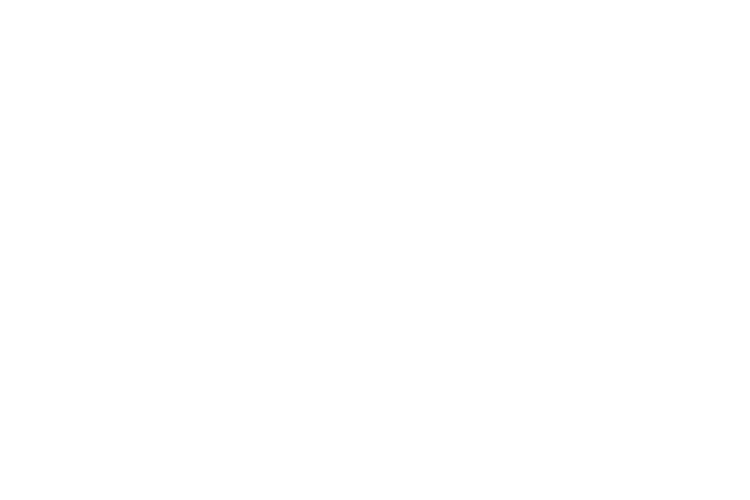

<IPython.core.display.Javascript object>


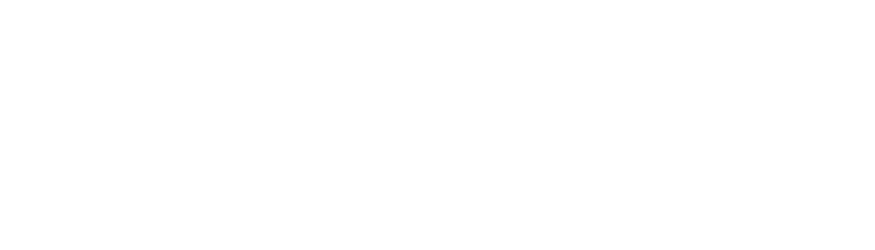

<IPython.core.display.Javascript object>


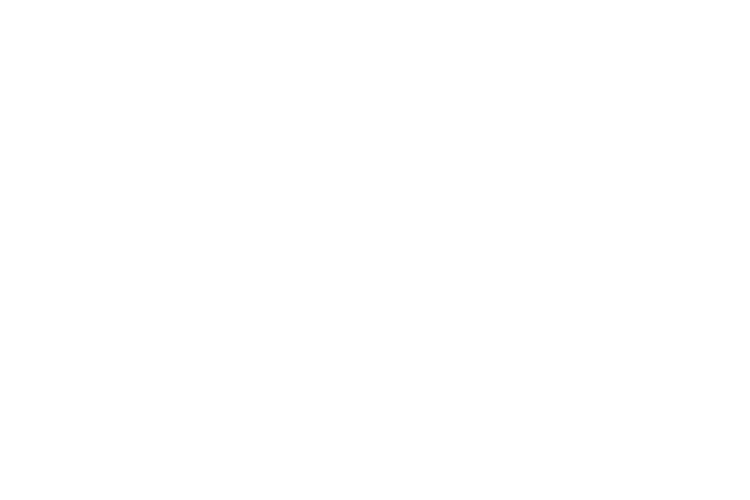

<IPython.core.display.Javascript object>


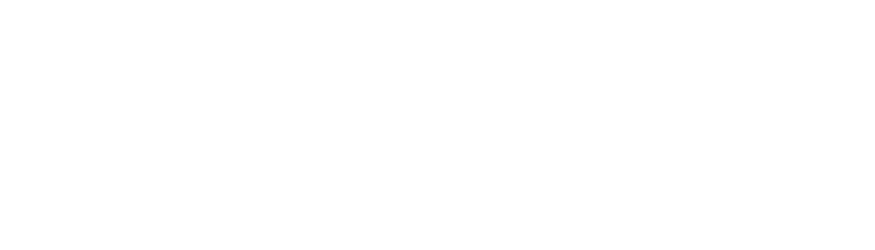

<IPython.core.display.Javascript object>


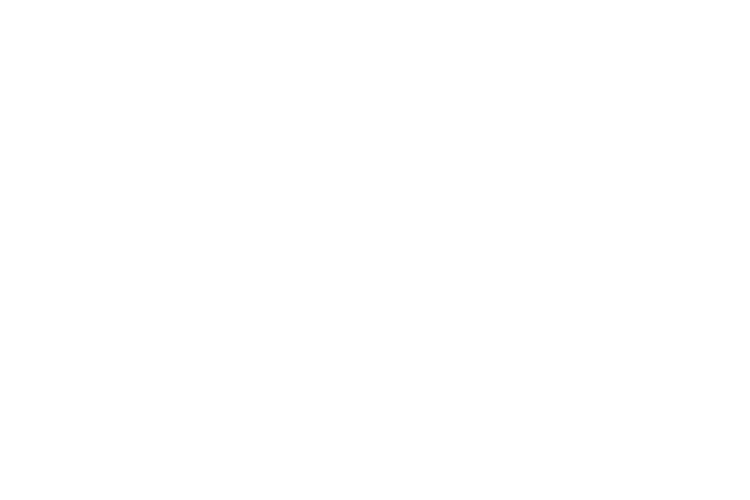

<IPython.core.display.Javascript object>


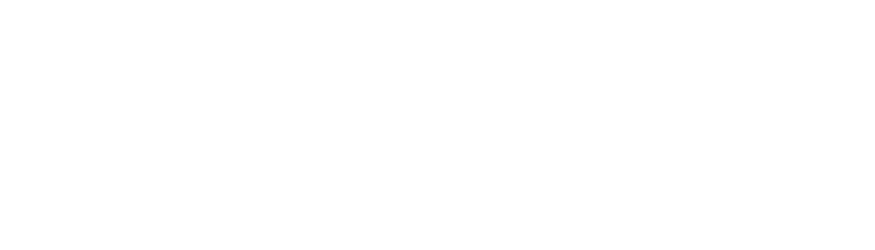

<IPython.core.display.Javascript object>


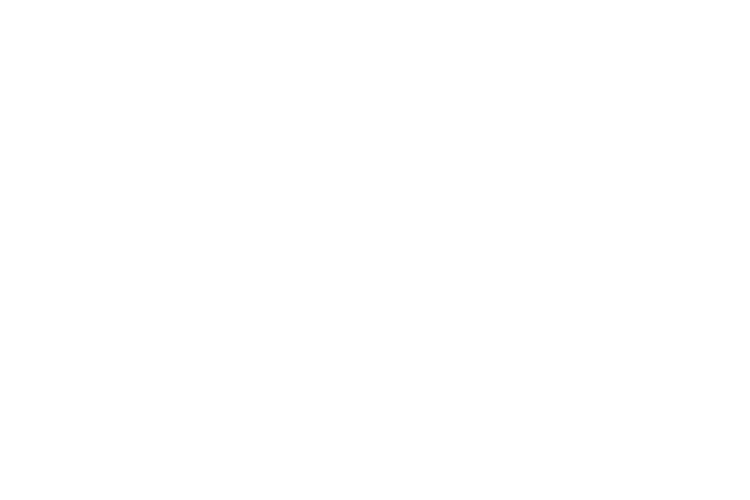

<IPython.core.display.Javascript object>


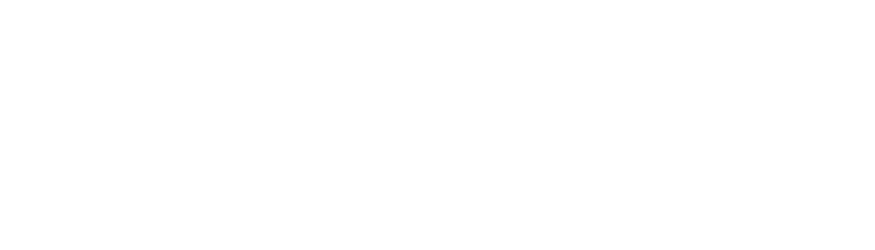

<IPython.core.display.Javascript object>


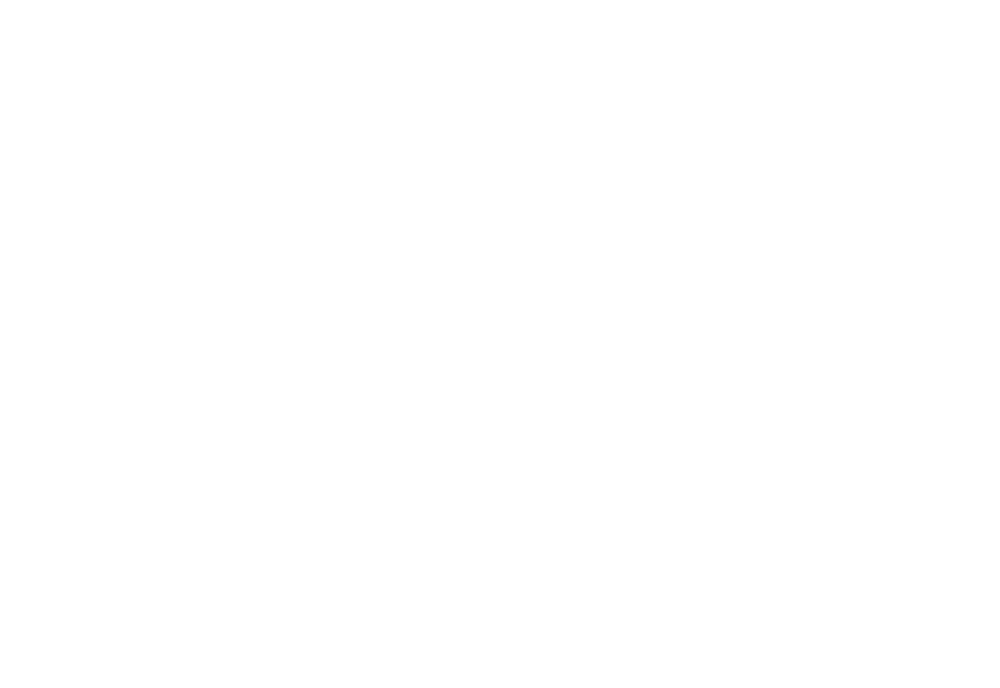

<IPython.core.display.Javascript object>


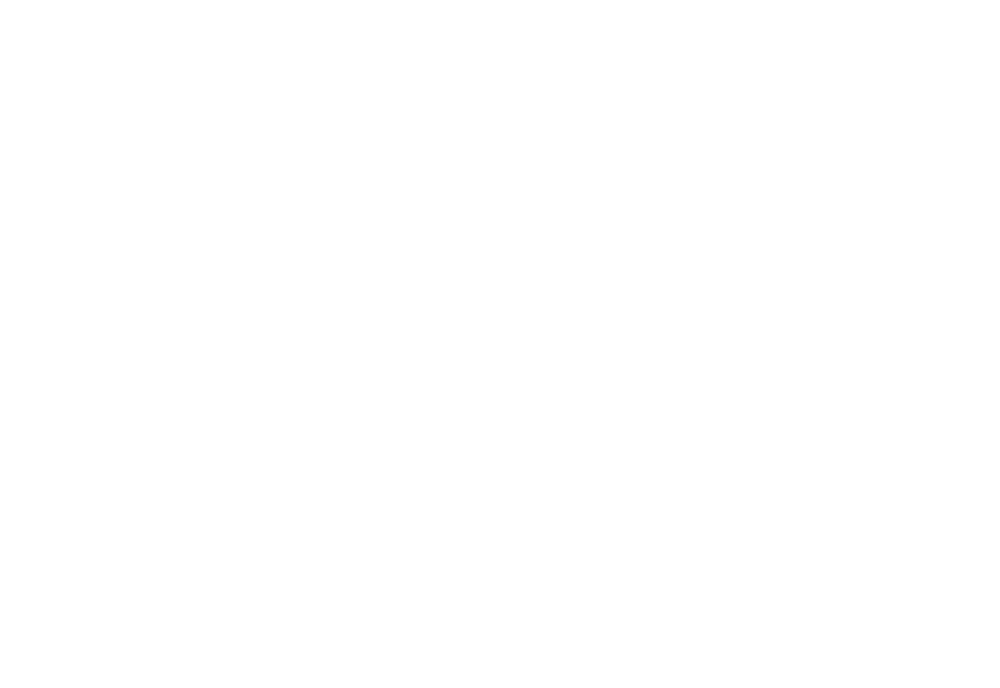

<IPython.core.display.Javascript object>


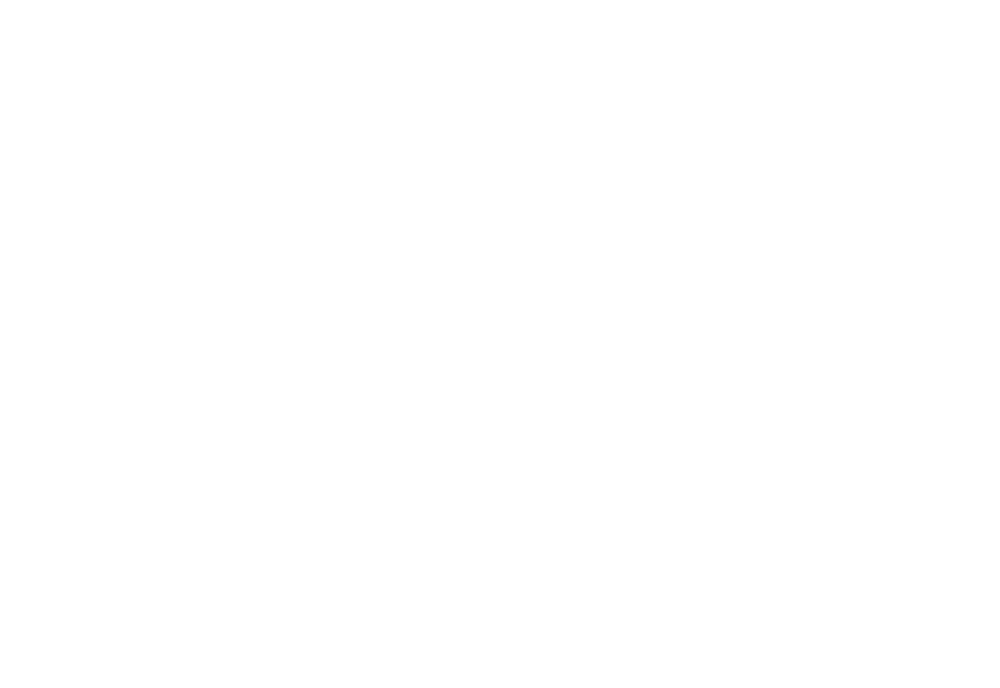

<IPython.core.display.Javascript object>


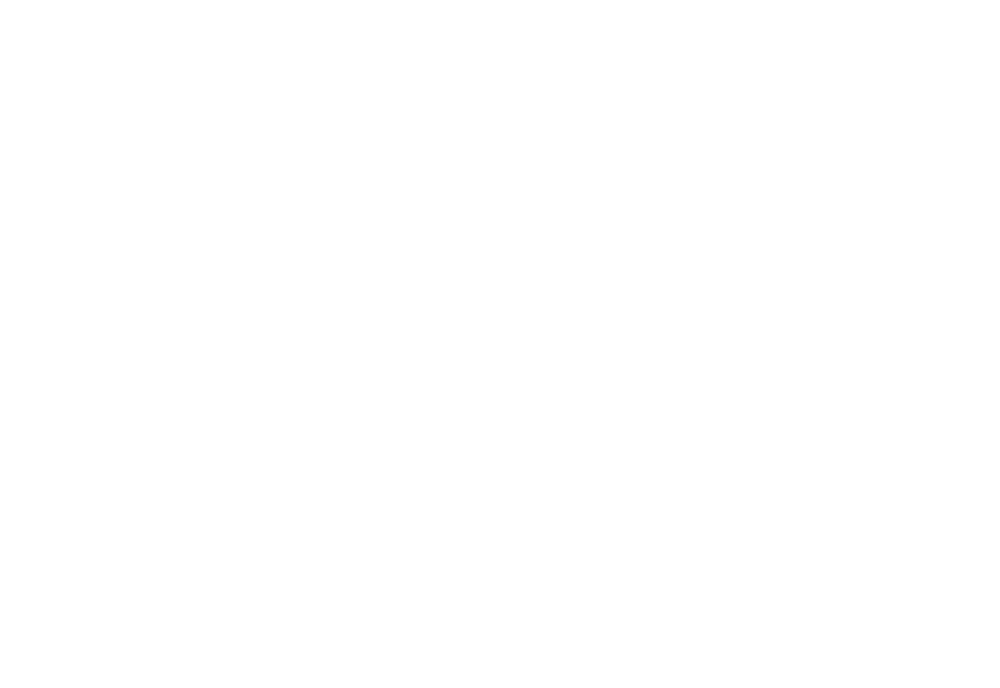

<IPython.core.display.Javascript object>


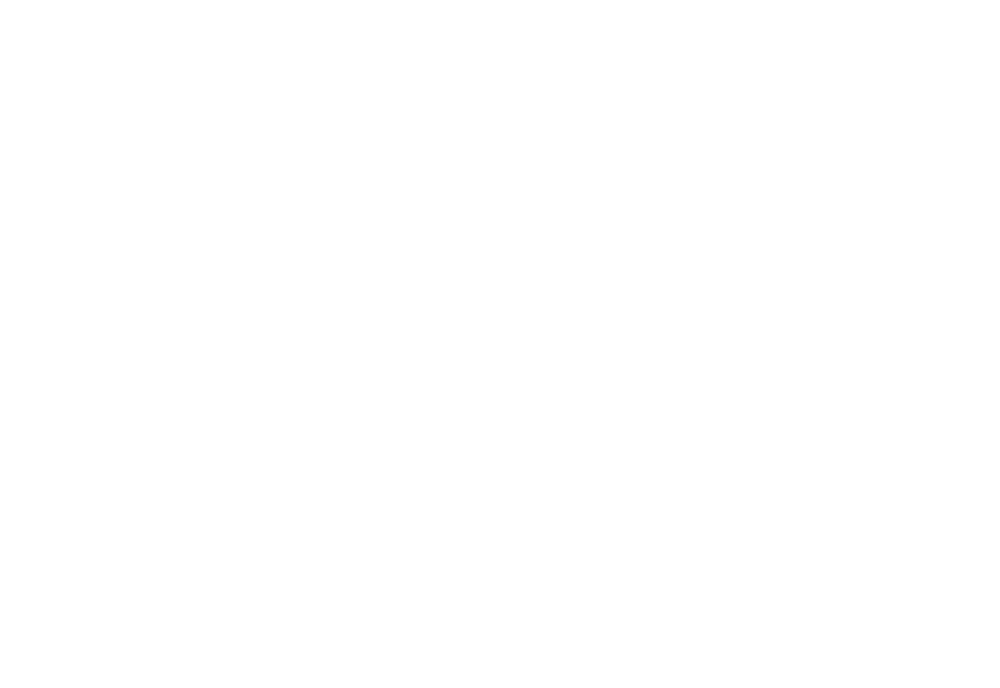

<IPython.core.display.Javascript object>


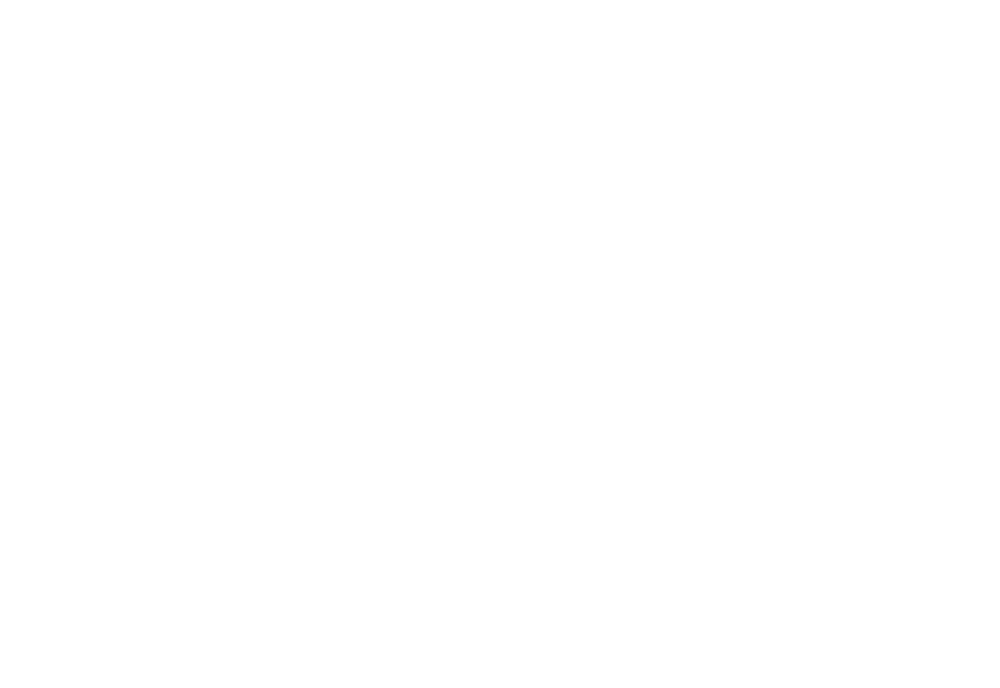

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [58]:
df_F.profile_report()

<IPython.core.display.Javascript object>


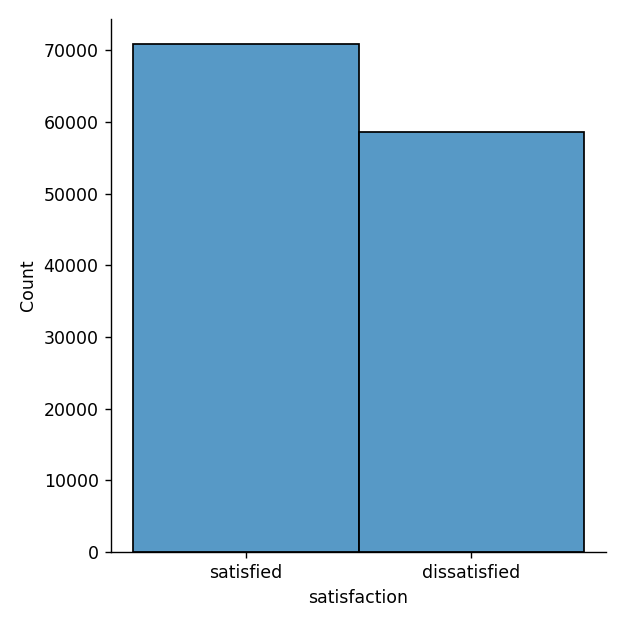

In [61]:
import seaborn as sns
sns.displot(df_clean["satisfaction"])

To give an equal 50/50 chance to the training data, label data will need to be balanced.

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Encoding Categorical Data <h3>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [62]:
df_clean = pd.get_dummies(df_clean, columns=["Gender", "custom_type", "travel_type"])

In [101]:
df_clean.head()

,satisfaction,Age,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,...,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,Gender_Female,Gender_Male,ct_l,ct_dl,tt_busi,tt_pers
0,1,65,1.0,265,0,0.0,3,3,3,2,...,3,5,3,2,1,0,1,0,0,1
1,1,47,0.0,2464,310,305.0,3,3,3,3,...,4,2,3,2,0,1,1,0,0,1
2,1,15,1.0,2138,0,0.0,3,3,3,3,...,4,4,4,2,1,0,1,0,0,1
3,1,60,1.0,623,0,0.0,3,3,3,3,...,1,4,1,3,1,0,1,0,0,1
4,1,70,1.0,354,0,0.0,3,3,3,3,...,2,4,2,5,1,0,1,0,0,1


In [102]:
from sklearn.preprocessing import OrdinalEncoder

In [103]:
enc = OrdinalEncoder()

In [104]:
enc.fit_transform(df_clean[['Class']])

array([[1.],
       [0.],
       [1.],
       ...,
       [1.],
       [1.],
       [1.]])

In [105]:
df_clean [ ["Class"]] = enc.fit_transform(df_clean[["Class"]])

In [106]:
df_clean.head()

,satisfaction,Age,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,...,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,Gender_Female,Gender_Male,ct_l,ct_dl,tt_busi,tt_pers
0,1,65,1.0,265,0,0.0,3,3,3,2,...,3,5,3,2,1,0,1,0,0,1
1,1,47,0.0,2464,310,305.0,3,3,3,3,...,4,2,3,2,0,1,1,0,0,1
2,1,15,1.0,2138,0,0.0,3,3,3,3,...,4,4,4,2,1,0,1,0,0,1
3,1,60,1.0,623,0,0.0,3,3,3,3,...,1,4,1,3,1,0,1,0,0,1
4,1,70,1.0,354,0,0.0,3,3,3,3,...,2,4,2,5,1,0,1,0,0,1


In [107]:
#target variable
label = df_clean[['satisfaction']]

In [108]:
from sklearn import preprocessing
  
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()
  
# Encode labels in column 'species'.
df_clean['satisfaction']= label_encoder.fit_transform(df_clean['satisfaction'])
  
df_clean['satisfaction'].unique()

array([1, 0], dtype=int64)

In [109]:
df_clean.head()

,satisfaction,Age,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,...,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,Gender_Female,Gender_Male,ct_l,ct_dl,tt_busi,tt_pers
0,1,65,1.0,265,0,0.0,3,3,3,2,...,3,5,3,2,1,0,1,0,0,1
1,1,47,0.0,2464,310,305.0,3,3,3,3,...,4,2,3,2,0,1,1,0,0,1
2,1,15,1.0,2138,0,0.0,3,3,3,3,...,4,4,4,2,1,0,1,0,0,1
3,1,60,1.0,623,0,0.0,3,3,3,3,...,1,4,1,3,1,0,1,0,0,1
4,1,70,1.0,354,0,0.0,3,3,3,3,...,2,4,2,5,1,0,1,0,0,1


<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h3 style="text-align:center"> Feature Selection using Decision Trees <h3>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

Feature selection as opposed to feature extraction has been determined by all student analysts to be the most optimal choice for reducing noise and maintaining important data for our ML prediciton. The reason we have come to this conclusion is feature extraction methods focus on reducing dimensionality with a combination of original features creating new features. Feature selection however, selects smaller subsets of features and has a much more improved version of readibility and interpretability. Thus, this has been chosen  under the method of decision trees.

Decision Trees work by classifying categories by order of lower gini. A gini index of 0 represents perfect equality while a gini of 100 implies perfect inequality.

In [110]:
from sklearn.tree import DecisionTreeClassifier       # Import Decision Tree Classifier
from sklearn.model_selection import train_test_split  # Import train_test_split function
from sklearn import metrics                           # Import scikit-learn metrics module for accuracy calculation
from sklearn import tree

import warnings
warnings.filterwarnings('ignore') # We can suppress the warnings

In [111]:
#renaming new columns with long words
#ct = custom_type
#tt = travel_type
#busi = business
#personal = pers
#dl = disloyal
#l = loyal
df_clean = df_clean.rename (columns ={"custom_type_Loyal Customer":"ct_l", "custom_type_disloyal Customer":"ct_dl", "travel_type_Business travel":"tt_busi", "travel_type_Personal Travel":"tt_pers"})          

In [112]:
df_clean.head()

,satisfaction,Age,Class,FlightDistance_rate,DepDelayMin,ArriveDelayMin,SeatComfort_rating,DepartArriveTime_rate,sustenance_rate,GateLocation_rate,...,BagHandle_rate,Checkin_rate,Cleanliness,OnlineBoard_rate,Gender_Female,Gender_Male,ct_l,ct_dl,tt_busi,tt_pers
0,1,65,1.0,265,0,0.0,3,3,3,2,...,3,5,3,2,1,0,1,0,0,1
1,1,47,0.0,2464,310,305.0,3,3,3,3,...,4,2,3,2,0,1,1,0,0,1
2,1,15,1.0,2138,0,0.0,3,3,3,3,...,4,4,4,2,1,0,1,0,0,1
3,1,60,1.0,623,0,0.0,3,3,3,3,...,1,4,1,3,1,0,1,0,0,1
4,1,70,1.0,354,0,0.0,3,3,3,3,...,2,4,2,5,1,0,1,0,0,1


In [113]:
pip install imblearn

Note: you may need to restart the kernel to use updated packages.


In [114]:
# split dataset in features and target variable
feature_cols = ["Age","Class","Gender_Female", "Gender_Male", "ct_l", "ct_dl", "tt_busi", "tt_pers", "FlightDistance_rate", "SeatComfort_rating", "DepartArriveTime_rate", "sustenance_rate", "GateLocation_rate", "FlightWifi_rate", "FlightEntertainment_rate","LegRoom_rate","BagHandle_rate","Checkin_rate","Cleanliness","OnlineBoard_rate","DepDelayMin","ArriveDelayMin"] 
X = df_clean[feature_cols]               # Features of the dataset
y = df_clean.satisfaction                       # Target variable of the dataset

# Display the X and y arrays
print(X, y)

        Age  Class  Gender_Female  Gender_Male  ct_l  ct_dl  tt_busi  tt_pers  \
0        65    1.0              1            0     1      0        0        1   
1        47    0.0              0            1     1      0        0        1   
2        15    1.0              1            0     1      0        0        1   
3        60    1.0              1            0     1      0        0        1   
4        70    1.0              1            0     1      0        0        1   
...     ...    ...            ...          ...   ...    ...      ...      ...   
129875   29    1.0              1            0     0      1        0        1   
129876   63    0.0              0            1     0      1        0        1   
129877   69    1.0              0            1     0      1        0        1   
129878   66    1.0              0            1     0      1        0        1   
129879   38    1.0              1            0     0      1        0        1   

        FlightDistance_rate

In [115]:
#SMOTE
#Creating new random rows to equalise data
from collections import Counter
from imblearn.over_sampling import SMOTE # doctest: +NORMALIZE_WHITESPACE

print('Original dataset shape %s' % Counter(y))


Original dataset shape Counter({1: 70882, 0: 58605})


In [116]:
#Original dataset shape Counter({1: 70882, 0: 58605})
sm = SMOTE(random_state = 42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({1: 70882, 0: 70882})


Synthetic Minority Over-Sampling Technique algorithim adds minority classes to even out imbalances, utilising K-nearest neighbours algorithim. In comparitive literature betweeb SMOTE and ADASYN, ( which was intended to address the problems of SMOTE) Taneja et.al 2019, found that SMOTE outperformed Adasyn in multiple imbalance imputations on a variety of models. Based on multiple similar studies such as Barros et.al (2019) and Davagdorj et al (2020), the analysts carrying out this piece of work have chosen to use SMOTE when handling imbalanced data. (Brandt.J & Lanzen.E, A comparitive review of SMOTE and ADASYN in imbalanced Data Classificatio, 2020)

In [117]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0) # 70% training and 30% test

In [118]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth = 3, random_state = 1)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [119]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

# Rounded upto 2 decimal places
print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.8367956341545035
Accuracy: 0.84


<IPython.core.display.Javascript object>


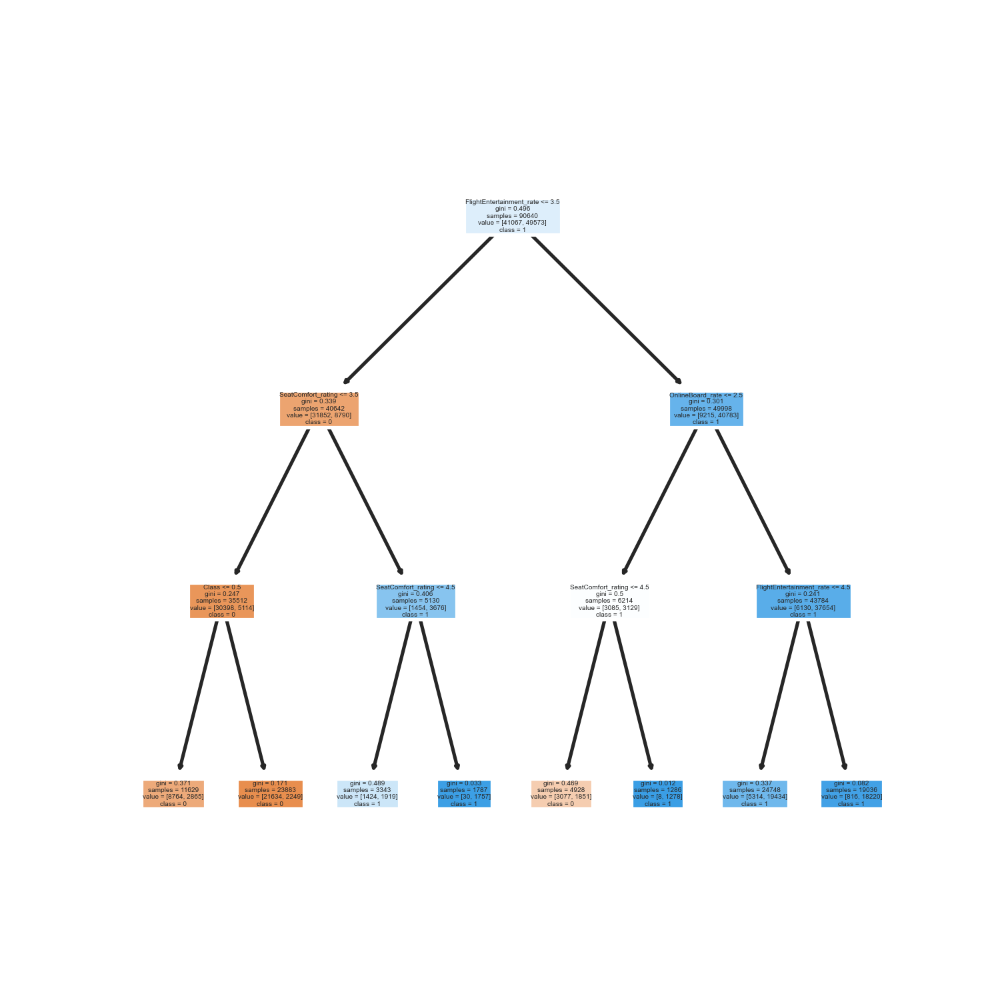

In [120]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# column names for dataset
fn=["Age","Class","Gender_Female","Gender_Male","ct_l","ct_dl","tt_busi","tt_pers","FlightDistance_rate","SeatComfort_rating","DepartArriveTime_rate","sustenance_rate","GateLocation_rate","FlightWifi_rate","FlightEntertainment_rate","LegRoom_rate","BagHandle_rate","Checkin_rate","Cleanliness","OnlineBoard_rate","DepDelayMin","ArriveDelayMin"]
# classes of dataset
cn=['0','1']

# Setting dpi = 300 to make image clearer than default
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)

tree.plot_tree(clf,
           feature_names = fn, 
           class_names = cn,
           filled = True);

<h6> Using decision tree to decide on most important features, using gini as a calculation, to determine characterization importance<h6>

In [121]:
#Person classification data placed in new dataFrame
df_class = df_clean[["satisfaction","Age","Class","Gender_Female","Gender_Male","tt_busi","tt_pers","ct_l","ct_dl"]] 


In [122]:
df_class.head()

,satisfaction,Age,Class,Gender_Female,Gender_Male,tt_busi,tt_pers,ct_l,ct_dl
0,1,65,1.0,1,0,0,1,1,0
1,1,47,0.0,0,1,0,1,1,0
2,1,15,1.0,1,0,0,1,1,0
3,1,60,1.0,1,0,0,1,1,0
4,1,70,1.0,1,0,0,1,1,0


In [123]:
# split dataset in features and target variable
feature_cols = ["Age","Class","Gender_Female","Gender_Male","tt_busi","tt_pers","ct_l","ct_dl"]
X = df_class[feature_cols]               # Features of the dataset
y = df_class.satisfaction                       # Target variable of the dataset

# Display the X and y arrays
print(X, y)

        Age  Class  Gender_Female  Gender_Male  tt_busi  tt_pers  ct_l  ct_dl
0        65    1.0              1            0        0        1     1      0
1        47    0.0              0            1        0        1     1      0
2        15    1.0              1            0        0        1     1      0
3        60    1.0              1            0        0        1     1      0
4        70    1.0              1            0        0        1     1      0
...     ...    ...            ...          ...      ...      ...   ...    ...
129875   29    1.0              1            0        0        1     0      1
129876   63    0.0              0            1        0        1     0      1
129877   69    1.0              0            1        0        1     0      1
129878   66    1.0              0            1        0        1     0      1
129879   38    1.0              1            0        0        1     0      1

[129487 rows x 8 columns] 0         1
1         1
2         1
3

In [124]:
from collections import Counter
from imblearn.over_sampling import SMOTE # doctest: +NORMALIZE_WHITESPACE

print('Original dataset shape %s' % Counter(y))

Original dataset shape Counter({1: 70882, 0: 58605})


In [125]:
#Original dataset shape Counter({1: 70882, 0: 58605})
sm = SMOTE(random_state = 42)
X_res, y_res = sm.fit_resample(X, y)
print('Resampled dataset shape %s' % Counter(y_res))

Resampled dataset shape Counter({1: 70882, 0: 70882})


In [126]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0) # 70% training and 30% test

In [127]:
# Create Decision Tree classifer object
clf = DecisionTreeClassifier(max_depth = 2, random_state = 1)

# Train Decision Tree Classifer
clf = clf.fit(X_train, y_train)

#Predict the response for test dataset
y_pred = clf.predict(X_test)

In [128]:
# Model Accuracy, how often is the classifier correct?
print("Accuracy:",metrics.accuracy_score(y_test, y_pred))

# Rounded upto 2 decimal places
print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.7147784899734857
Accuracy: 0.71


<IPython.core.display.Javascript object>


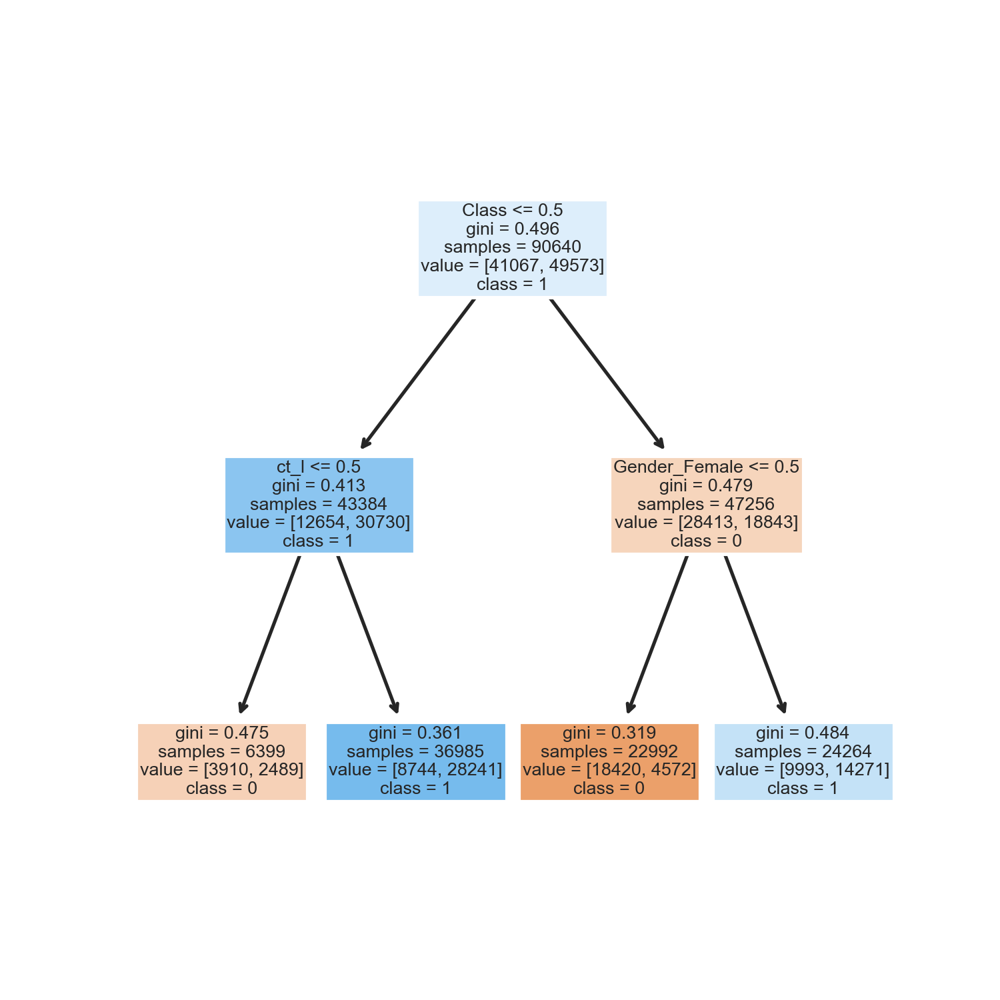

In [129]:
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree

# column names for dataset
fn=["Age","Class","Gender_Female","Gender_Male","tt_busi","tt_pers","ct_l","ct_dl"]
# classes of dataset
cn=['0','1']

# Setting dpi = 300 to make image clearer than default
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=300)

tree.plot_tree(clf,
           feature_names = fn, 
           class_names = cn,
           filled = True);

<i> A Gini index of 0 represents perfect equality, while an index of 100 implies perfect inequality. Gini is the statisitcal computation utilised by deision trees and has been chosen to act as a feature selector to statistically represent data with the strongest coefficient.

Seperating the data allows for a selection that was (a) based on all correlations of data and (b) the most import characterization features for satisfied and unsatisfied. Thes features will be used together to construct further training algorithims.

### Using Random Forest to cross-check and reassess feature selection

In [130]:
# split dataset in features and target variable
feature_cols = ["Age","Class","Gender_Female", "Gender_Male", "ct_l", "ct_dl", "tt_busi", "tt_pers", "FlightDistance_rate", "SeatComfort_rating", "DepartArriveTime_rate", "sustenance_rate", "GateLocation_rate", "FlightWifi_rate", "FlightEntertainment_rate","LegRoom_rate","BagHandle_rate","Checkin_rate","Cleanliness","OnlineBoard_rate","DepDelayMin","ArriveDelayMin"] 
X = df_clean[feature_cols]               # Features of the dataset
y = df_clean.satisfaction                       # Target variable of the dataset

# Display the X and y arrays
print(X, y)

        Age  Class  Gender_Female  Gender_Male  ct_l  ct_dl  tt_busi  tt_pers  \
0        65    1.0              1            0     1      0        0        1   
1        47    0.0              0            1     1      0        0        1   
2        15    1.0              1            0     1      0        0        1   
3        60    1.0              1            0     1      0        0        1   
4        70    1.0              1            0     1      0        0        1   
...     ...    ...            ...          ...   ...    ...      ...      ...   
129875   29    1.0              1            0     0      1        0        1   
129876   63    0.0              0            1     0      1        0        1   
129877   69    1.0              0            1     0      1        0        1   
129878   66    1.0              0            1     0      1        0        1   
129879   38    1.0              1            0     0      1        0        1   

        FlightDistance_rate

In [131]:
# Split dataset into training set and test set
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0) # 70% training and 30% tes

In [132]:
from sklearn.ensemble import RandomForestClassifier

In [133]:
clf_RF = RandomForestClassifier(n_estimators = 1000)
clf_RF.fit(X_train ,y_train)

RandomForestClassifier(n_estimators=1000)

In [134]:
import pandas as pd
feature_imp = pd.Series(clf_RF.feature_importances_).sort_values(ascending = False)
feature_imp

14    0.209689
9     0.107976
19    0.055674
15    0.054315
1     0.047939
0     0.045455
8     0.044933
16    0.041914
18    0.040939
17    0.036768
5     0.032427
4     0.031326
11    0.030033
3     0.029019
10    0.027313
2     0.026901
12    0.026607
6     0.024699
7     0.024569
13    0.021480
21    0.020742
20    0.019283
dtype: float64

In [135]:
from sklearn.model_selection import KFold

X_train_val, X_test, y_train_val, y_test = train_test_split(X, y, test_size=0.2,random_state=42)
kf = KFold(n_splits=5, shuffle=True, random_state = 71)

In [136]:
df_impt = pd.DataFrame({'features':X_train_val.columns,'importance':clf_RF.feature_importances_})
df_impt = df_impt.sort_values(by='importance',ascending=False)
df_impt

,features,importance
14,FlightEntertainment_rate,0.209689
9,SeatComfort_rating,0.107976
19,OnlineBoard_rate,0.055674
15,LegRoom_rate,0.054315
1,Class,0.047939
0,Age,0.045455
8,FlightDistance_rate,0.044933
16,BagHandle_rate,0.041914
18,Cleanliness,0.040939
17,Checkin_rate,0.036768


<IPython.core.display.Javascript object>


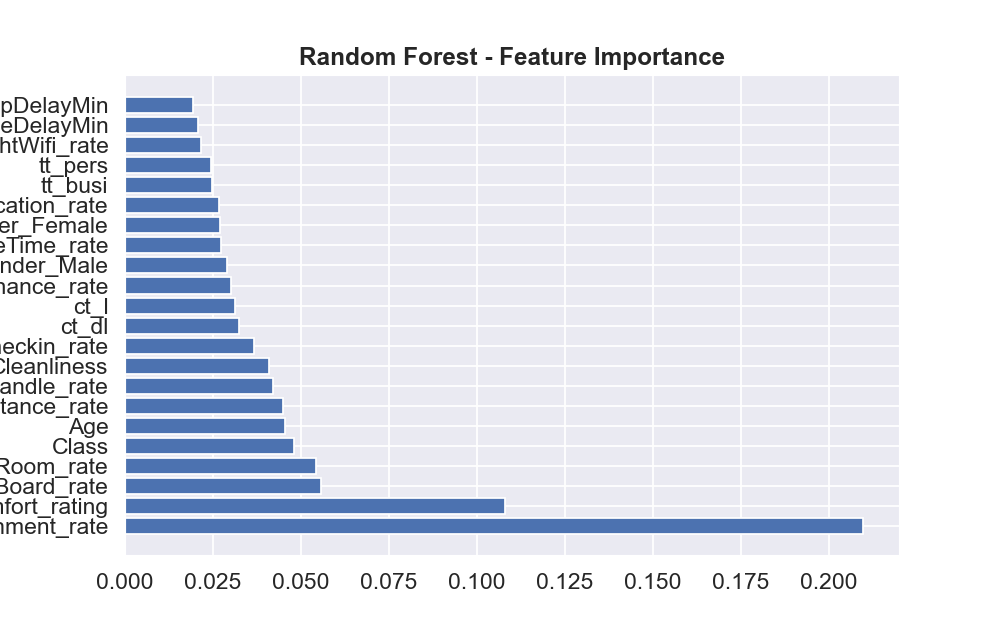

In [168]:
sns.set(style='darkgrid',font_scale=1.2)
fig = plt.figure(figsize=[8,5])
ax = plt.barh(df_impt['features'],df_impt['importance'])
plt.title('Random Forest - Feature Importance',weight='bold',fontsize=14)
plt.savefig('featureplot.png',transparent=True, bbox_inches='tight')
plt.show()

(Tan Pengshi Alvin, 2020)

Based on Decision Tree and Random Forest feature selection we are going to take the following features to use for our Machine Learning models:

   **Rating Features:**
        
        - FlightEntertainment_rate  
        - SeatComfort_rating  
        - OnlineBoard_rate  
    
   **Customer Type Featues:**
        
        - Class  
        - Gender_Female  
    
The choice of features was made considering a mix of rating features and customer type features.  
<i>We tried to include "Age" in the Machine Learning model but accuracy between Train and Test decreased so it was removed.

<IPython.core.display.Javascript object>


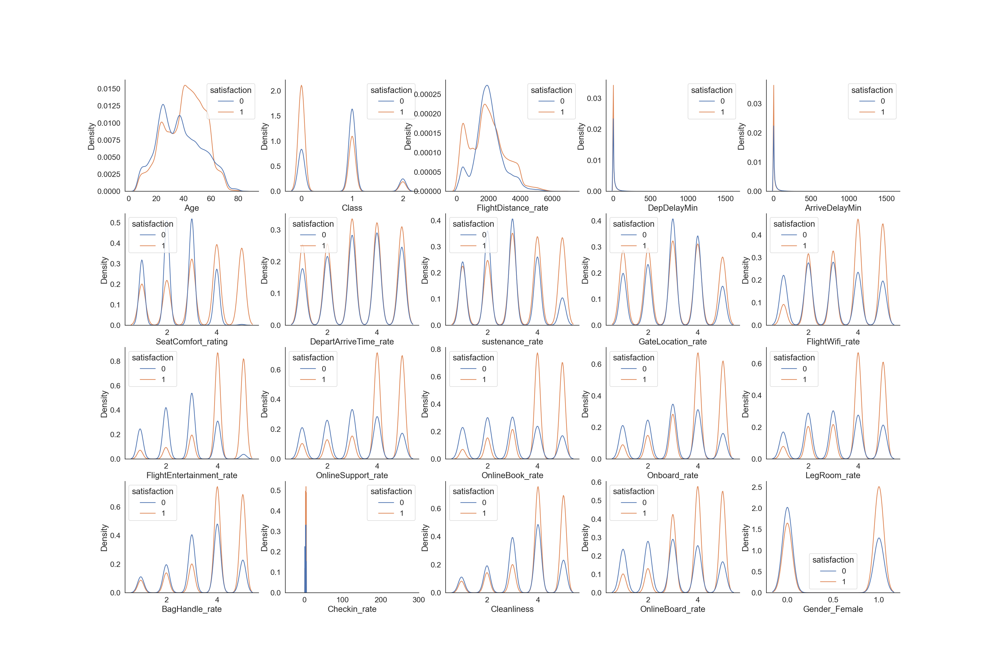

In [138]:
sns.set(style='white',font_scale=1.5)
fig = plt.figure(figsize=[30,20])
for i in range(20):
    fig.add_subplot(4, 5, i+1)
    sns.kdeplot(data=df_clean,x=df_clean.columns[i+1],hue='satisfaction')
    if i == 16:
        plt.xlim([-50,300])
    sns.despine()
    plt.savefig('kdeplot.png',transparent=True, bbox_inches='tight')

(Tan Pengshi Alvin, 2020)

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

<h4 style="text-align:center"> Machine Learning Model with new dataframe <h4>
    <h6 style="text-align:center"> Predicting contributory factors to satisfaction levels <h6>

<hr style="height:2px; width:50%; border-width:0; color:orange; background-color:orange">

In [139]:
#new df for ML
#although "LoyalCustom" and 'class' and 'gender_female' returned in one of the two random trees, 
# "LoyalCustom" could not be related back by either heatmap and its significance is low in full context.
df_ml = df_clean[["satisfaction","Class","Gender_Female","SeatComfort_rating","FlightEntertainment_rate","OnlineBoard_rate"]] 

In [140]:
df_ml.head()

,satisfaction,Class,Gender_Female,SeatComfort_rating,FlightEntertainment_rate,OnlineBoard_rate
0,1,1.0,1,3,4,2
1,1,0.0,0,3,2,2
2,1,1.0,1,3,3,2
3,1,1.0,1,3,4,3
4,1,1.0,1,3,3,5


## Sample Data

In [141]:
X = df_ml.drop(columns="satisfaction")
y = df_ml.satisfaction

In [142]:
X

,Class,Gender_Female,SeatComfort_rating,FlightEntertainment_rate,OnlineBoard_rate
0,1.0,1,3,4,2
1,0.0,0,3,2,2
2,1.0,1,3,3,2
3,1.0,1,3,4,3
4,1.0,1,3,3,5
...,...,...,...,...,...
129875,1.0,1,5,5,2
129876,0.0,0,2,1,1
129877,1.0,0,3,2,2
129878,1.0,0,3,2,2


In [143]:
from sklearn.model_selection import train_test_split, KFold

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        test_size=0.3, random_state=42)

### Scaling using MinMax

In [144]:
from sklearn.preprocessing import MinMaxScaler

In [145]:
cols = ['Class', 'Gender_Female', 'SeatComfort_rating', 'FlightEntertainment_rate', 'OnlineBoard_rate']
min_max = MinMaxScaler()

X_train = min_max.fit_transform(X_train)
X_test = min_max.fit_transform(X_test)

In [146]:
X_train

array([[0.  , 1.  , 0.75, 1.  , 0.5 ],
       [0.5 , 0.  , 0.5 , 0.5 , 0.  ],
       [0.5 , 1.  , 0.5 , 0.25, 0.25],
       ...,
       [0.5 , 1.  , 0.5 , 0.5 , 0.  ],
       [0.5 , 1.  , 0.75, 0.75, 0.  ],
       [0.  , 0.  , 0.5 , 1.  , 1.  ]])

### Applying kNN model for k = 3

In [147]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import accuracy_score

In [148]:
kNN = KNeighborsClassifier(n_neighbors = 3)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "Accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )

Accuracy: 0.83


In [149]:
# Import the library for accuracy, precision and recall
from sklearn import metrics

# Display upto 2 decimal places
print( "accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.2f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.2f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.83
precision: 0.84
recall: 0.84


### kNN - Confusion Matrix

In [153]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_predict = kNN.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")


Text(2824.4849137931037, 0.5, 'true')

### kNN Hyperparameters and k number selection

In [154]:
from sklearn.metrics import classification_report

# Display the classification report
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.81      0.81      0.81     17639
           1       0.84      0.84      0.84     21208

    accuracy                           0.83     38847
   macro avg       0.83      0.83      0.83     38847
weighted avg       0.83      0.83      0.83     38847



In [155]:
import numpy as np
neighbors = np.arange(1, 11)                  # number of neighbors
train_accuracy = np.zeros(len(neighbors))     # Declare and initialise the matrix
test_accuracy = np.zeros(len(neighbors))      # Declare and initialise the matrix

In [156]:
for i, k in enumerate(neighbors):                          # for loop that checks the model for neighbor values 1, 2, 3, ..., 10
    kNN = KNeighborsClassifier(n_neighbors = k)            # Initialise an object knn using KNeighborsClassifier method

    # Fit the model
    kNN.fit(X_train, y_train)                              # Call fit method to implement the ML KNeighborsClassifier model

    # Compute accuracy on the training set
    train_accuracy[i] = kNN.score(X_train, y_train)        # Save the score value in the train_accuracy array

    # Compute accuracy on the test set
    test_accuracy[i] = kNN.score(X_test, y_test)           # Save the score value in the train_accuracy array

<IPython.core.display.Javascript object>


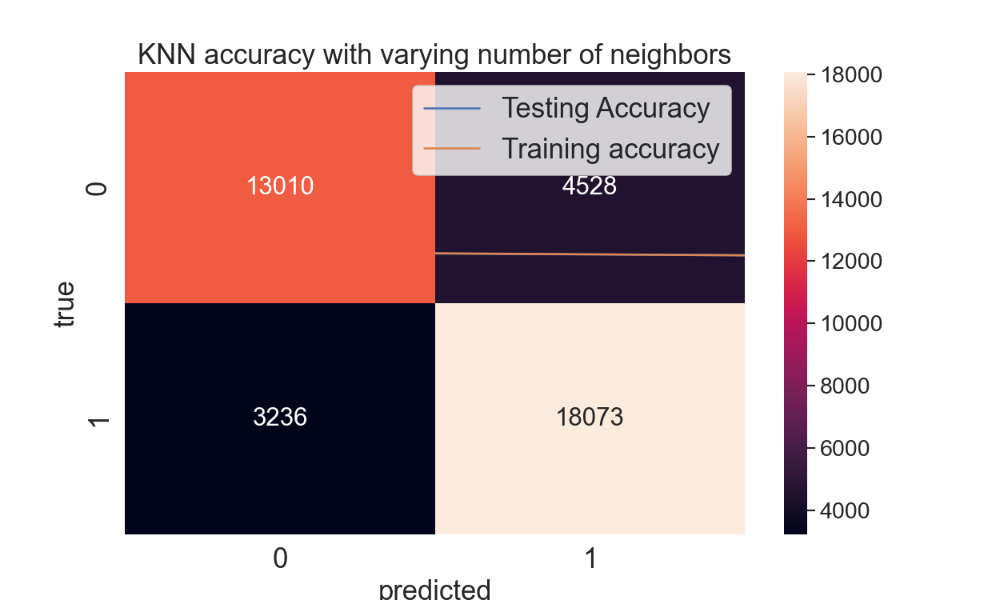

In [157]:
import matplotlib.pyplot as plt

plt.figure(figsize = (10, 6))
plt.title('KNN accuracy with varying number of neighbors', fontsize = 20)
plt.plot(neighbors, test_accuracy, label = 'Testing Accuracy')
plt.plot(neighbors, train_accuracy, label = 'Training accuracy')
plt.legend(prop={'size': 20})
plt.xlabel('Number of neighbors', fontsize = 20)
plt.ylabel('Accuracy', fontsize = 20)
plt.xticks(fontsize = 20)
plt.yticks(fontsize = 20)
plt.show()

By looking at the accuracy comparison we have decided to take 5 k neighbours as our optimal k number.

In [158]:
kNN = KNeighborsClassifier(n_neighbors = 5)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.2f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.2f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.84
precision: 0.85
recall: 0.86


In [159]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        test_size=0.2, random_state=42)

In [160]:
kNN = KNeighborsClassifier(n_neighbors = 5)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.2f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.2f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.84
precision: 0.86
recall: 0.84


In [161]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, 
                                        test_size=0.1, random_state=42)

In [162]:
kNN = KNeighborsClassifier(n_neighbors = 5)
kNN.fit(X_train, y_train)
y_pred = kNN.predict(X_test)

print( "accuracy: {:.2f}".format(metrics.accuracy_score(y_test, y_pred)) )
print( "precision: {:.2f}".format(metrics.precision_score(y_test, y_pred)) )
print( "recall: {:.2f}".format(metrics.recall_score(y_test, y_pred)) )

accuracy: 0.83
precision: 0.85
recall: 0.84


By looking at the comparison of the model using 30% / 20% and 10% test size split we have decided to take 20% as the best split for improving accuracy metrics.

## Logistic Regression with Sklearn

In [163]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=0)
logreg = LogisticRegression()
logreg.fit(X_train, y_train)

log = LogisticRegression()

log.fit(X_train,y_train)

pred = log.predict(X_test)

#Now let's see how successful our predictions are:
print("with Logistic Regression accuracy_score: ",accuracy_score(y_test,pred))

with Logistic Regression accuracy_score:  0.8001390068731176


### Logistic Regression - Confusion Matrix

In [164]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_predict = log.predict(X_test)
cm = confusion_matrix(y_test, y_predict)

sns.heatmap(cm, annot = True, fmt='g')
plt.xlabel("predicted")
plt.ylabel("true")

Text(80.25, 0.5, 'true')

### Hyperparameters and Accuracy validation

In [165]:
from sklearn.metrics import classification_report
print(classification_report(y_test, y_predict))

              precision    recall  f1-score   support

           0       0.80      0.74      0.77     17538
           1       0.80      0.85      0.82     21309

    accuracy                           0.80     38847
   macro avg       0.80      0.79      0.80     38847
weighted avg       0.80      0.80      0.80     38847



### ROC Curve

<IPython.core.display.Javascript object>


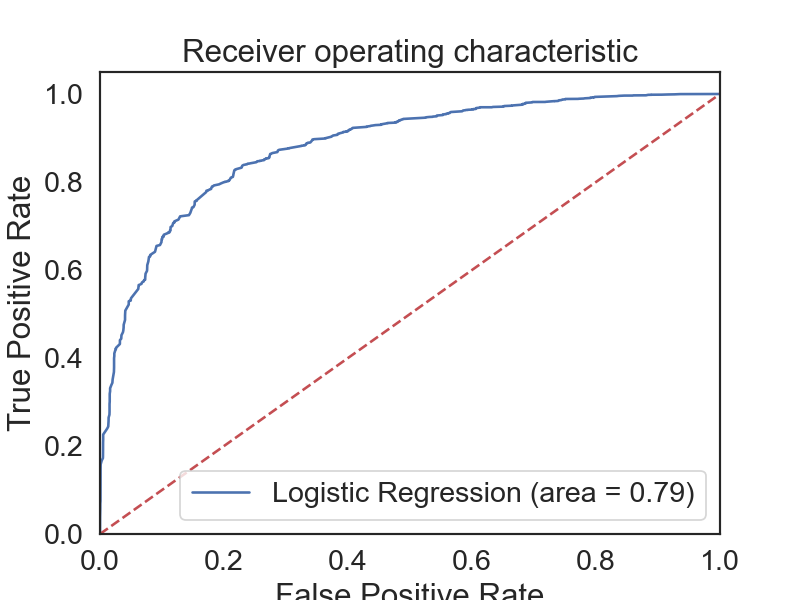

In [166]:
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
logit_roc_auc = roc_auc_score(y_test, logreg.predict(X_test))
fpr, tpr, thresholds = roc_curve(y_test, logreg.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr, tpr, label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0, 1], [0, 1],'r--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.savefig('Log_ROC')
plt.show()

# Bibliography

Predicting Satisfaction of Airline Passengers by Classification, (Tan Pengshi Alvin, 2020), https://github.com/tanpengshi/Metis_Project_3_Classification

